### Preliminary cell to start the notebook

In [45]:
# libraries
import os
import sys
import platform
print(sys.version)

strong_pc = platform.system() == 'Linux'
in_colab = 'google.colab' in sys.modules
if in_colab:
    if not os.getcwd().split('/')[-1].split('_')[-1]=='2023':
        from google.colab import drive
        drive.mount('/content/drive')
        os.chdir(r'/content/drive/MyDrive/Human_Data_Analytics_Project_2023')

    #!pip install tensorflow==2.11.0
    #!pip install tensorflow_text==2.11.0
    if not 'tensorflow_io' in sys.modules:
        print('Installing tensorflow-IO')
        !pip install tensorflow-io
    if not 'keras' in sys.modules and False:
        print('Installing keras')
        !pip install keras==2.11.0
    if not 'scikeras' in sys.modules:
        print('Installing scikeras')
        !pip install scikeras[tensorflow]
    if not 'keras-tuner' in sys.modules:
        print('installing keras tuner')
        !pip install keras-tuner
        !pip install numba==0.57.0


if 'DEEPNOTE_ENV' in os.environ:
    os.chdir('/..')
    os.chdir('datasets')
    os.chdir('googledrivedeepnoteintegration')
    os.chdir('Human_Data_Analytics_Project_2023')
    if not 'librosa' in sys.modules:
        print('Installing Librosa')
        !pip install librosa
    if not 'scikeras' in sys.modules:
        print('Installing scikeras')
        !pip install scikeras[tensorflow]
    if not 'keras-tuner' in sys.modules:
        print('installing keras tuner')
        !pip install keras-tuner
        !pip install numba==0.57.0

main_dir = os.getcwd()
if main_dir not in sys.path:
    print('Adding the folder for the modules')
    sys.path.append(main_dir)

#BASE LIBRARIES
import numpy as np
import pandas as pd
import h5py
import shutil
import time
import random
import subprocess
import itertools
import warnings
import pickle
import json

#PLOT LIBRARIES
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import IPython.display as ipd
#import plotly.express as px

#AUDIO LIBRARIES
import librosa
from scipy.io import wavfile
from scipy import signal
from scipy.fft import fft,ifft,fftfreq, fftshift
from scipy.signal import stft,spectrogram,periodogram
#from pydub import AudioSegment

#MACHINE LEARNING LIBRARIES
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, LeaveOneOut, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, FunctionTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils import check_random_state
from scikeras.wrappers import KerasClassifier
import tensorflow as tf
from tensorflow.keras.models import load_model

# GPU SETTINGS FOR LINUX and repressing warnings for windows. References for gpu: https://www.tensorflow.org/guide/gpu
show_gpu_activity = False
if sys.platform == 'linux' and not in_colab:
    if show_gpu_activity:
        tf.debugging.set_log_device_placement(True)

    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
    # Restrict TensorFlow to only allocate a part of memory on the first GPU
        try:
            tf.config.set_logical_device_configuration(
                gpus[0],
                [tf.config.LogicalDeviceConfiguration(memory_limit=6800)])
            logical_gpus = tf.config.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        except RuntimeError as e:
            # Virtual devices must be set before GPUs have been initialized
            print(e)
else:
    warnings.filterwarnings("ignore", category=UserWarning)

from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.utils import plot_model as tf_plot
if in_colab:
    import tensorflow_io as tfio
print("TensorFlow version:", tf.__version__)
# show keras version
import keras
print(f'keras version = {keras.__version__}')
#import keras_tune as kt
from keras import layers
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras.regularizers import L1L2
# kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4) # we may use this in some layers...

#RANDOM SETTINGS
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
check_random_state(seed)

#EVALUATION LIBRAIRES
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve
from sklearn.metrics import make_scorer
from sklearn.metrics import RocCurveDisplay, precision_recall_curve, PrecisionRecallDisplay
from sklearn.metrics import precision_recall_fscore_support, auc

#OUR PERSONAL FUNCTIONS
import importlib
from Preprocessing.data_loader import download_dataset,load_metadata
from Preprocessing.exploration_plots import one_random_audio, plot_clip_overview, Spectral_Analysis
from Models.basic_ml import basic_ML_experiments, basic_ML_experiments_gridsearch, build_dataset, extract_flatten_MFCC
from Visualization.model_plot import confusion_matrix,listen_to_wrong_audio

importlib.reload(importlib.import_module('Preprocessing.data_loader'))
importlib.reload(importlib.import_module('Models.basic_ml'))
importlib.reload(importlib.import_module('Visualization.model_plot'))

from Preprocessing.data_loader import load_metadata
df_ESC10, df_ESC50 = load_metadata(main_dir,heads = False, ESC_US = False, statistics=False)

from Preprocessing.data_loader import load_metadata
from Models.basic_ml import basic_ML_experiments, basic_ML_experiments_gridsearch, build_dataset, extract_flatten_MFCC

importlib.reload(importlib.import_module('Models.ann_utils'))
importlib.reload(importlib.import_module('Visualization.model_plot'))

from Models.ann_utils import *
from Models.ann_utils import MFCCWithDeltaLayer,OutputCutterLayer
from Visualization.model_plot import plot_history, confusion_matrix, listen_to_wrong_audio, visualize_the_weights

ESC10_path = os.path.join(main_dir,'Data', 'ESC-10-depth')
samplerate = 44100

3.11.4 (main, Jul  5 2023, 08:54:11) [Clang 14.0.6 ]
TensorFlow version: 2.12.0
keras version = 2.12.0


# **Environmetal sound classification**


<a href="https://github.com/GianmarcoLattaruolo/Human_Data_Analytics_Project_2023/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Here we import the drive (in the case in which we are running the notebook on Colab) and prepare the environment.

In [46]:
import os
import sys
import platform
print(sys.version)

strong_pc = platform.system() == 'Linux'
in_colab = 'google.colab' in sys.modules
if in_colab:
    if not os.getcwd().split('/')[-1].split('_')[-1]=='2023':
        from google.colab import drive
        drive.mount('/content/drive')
        os.chdir(r'/content/drive/MyDrive/Human_Data_Analytics_Project_2023')

    #!pip install tensorflow==2.11.0
    #!pip install tensorflow_text==2.11.0
    if not 'tensorflow_io' in sys.modules:
        print('Installing tensorflow-IO')
        !pip install tensorflow-io
    if not 'keras' in sys.modules and False:
        print('Installing keras')
        !pip install keras==2.11.0
    if not 'scikeras' in sys.modules:
        print('Installing scikeras')
        !pip install scikeras[tensorflow]
    if not 'keras-tuner' in sys.modules:
        print('installing keras tuner')
        !pip install keras-tuner
        !pip install numba==0.57.0


if 'DEEPNOTE_ENV' in os.environ:
    os.chdir('/..')
    os.chdir('datasets')
    os.chdir('googledrivedeepnoteintegration')
    os.chdir('Human_Data_Analytics_Project_2023')
    if not 'librosa' in sys.modules:
        print('Installing Librosa')
        !pip install librosa
    if not 'scikeras' in sys.modules:
        print('Installing scikeras')
        !pip install scikeras[tensorflow]
    if not 'keras-tuner' in sys.modules:
        print('installing keras tuner')
        !pip install keras-tuner
        !pip install numba==0.57.0

main_dir = os.getcwd()
if main_dir not in sys.path:
    print('Adding the folder for the modules')
    sys.path.append(main_dir)


# GPU SETTINGS FOR LINUX and repressing warnings for windows. References for gpu: https://www.tensorflow.org/guide/gpu
show_gpu_activity = False
if sys.platform == 'linux' and not in_colab:
    if show_gpu_activity:
        tf.debugging.set_log_device_placement(True)

    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
    # Restrict TensorFlow to only allocate a part of memory on the first GPU
        try:
            tf.config.set_logical_device_configuration(
                gpus[0],
                [tf.config.LogicalDeviceConfiguration(memory_limit=6800)])
            logical_gpus = tf.config.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        except RuntimeError as e:
            # Virtual devices must be set before GPUs have been initialized
            print(e)
else:
    warnings.filterwarnings("ignore", category=UserWarning)

3.11.4 (main, Jul  5 2023, 08:54:11) [Clang 14.0.6 ]


In this cell, we import the libraries employed in our study, along with various custom scripts developed to enhance code readability. These scripts are accessible within our GitHub repository, organized into three principal directories:

-   **Preprocessing**:
    Within the "Preprocessing" directory, we provide the following scripts:
    -   `data_loader.py``: This script facilitates dataset acquisition, file integrity verification, and automatic distribution of files into appropriate subfolders. Note that we will not use commands from this script in the notebook as they serve only once, during the initial setup.
    -   `exploration_plots.py`: Designed for dataset visualization and audio file spectrum analysis, this script capitalizes on the capabilities of the `librosa` library. Multiple spectrograms are generated and explored within this context.
-   **Visualization**:
    The "Visualization" directory contains the `model_plot.py` script, which incorporates various utility functions we devised to visualize model outcomes. These functions encompass the presentation of the confusion matrix, history plots, weight and latent space visualizations, comparison to show the reconstruction capabilities of the autoencoders , as well as auditory playback functions.
-   **Models**:
    Our "Models" directory encompasses the following scripts:
    -   `basic_ml.py`: This script implements fundamental machine learning models, which are logistic regression, random forest, decision trees, k-nearest neighbors, and support vector machines. Both grid search procedures and training routines are integrated within this script to avoid a focused treatment of this non-neural model category. Indeed it's important to clarify that our primary emphasis does not lie in these basic models; rather, they are implemented for comparative reference.
    -   `ann_utils.py`: At the heart of our implementations lies the 'ann_utils' script. This script defines crucial functions for a wide array of tasks, such as constructing TensorFlow datasets with assorted preprocessing methodologies, creating, training, and evaluating models, as well as visualizing results. Of particular note is our exploration of grid search techniques, involving study and experimentation with two libraries: `keras-tuner` and `scikeras`.

By structuring our work in this manner, we hope to provide a clear framework for the execution, visualization, and evaluation of our methodologies. 

In [47]:
#BASE LIBRARIES
import numpy as np
import pandas as pd
import shutil
import time
import random
import warnings
import pickle
import json

#PLOT LIBRARIES
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import IPython.display as ipd #for the listen to audio files

#AUDIO LIBRARIES
import librosa

#BASIC MACHINE LEARNING LIBRARIES
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, LeaveOneOut, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, FunctionTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils import check_random_state

#DEEP LEARNING LIBRARIES
from scikeras.wrappers import KerasClassifier
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.utils import plot_model as tf_plot
import keras
from keras import layers
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras.regularizers import L1L2
if in_colab:
    import tensorflow_io as tfio
print("TensorFlow version:", tf.__version__)
print(f'keras version = {keras.__version__}')

#RANDOM SETTINGS
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
check_random_state(seed)

#EVALUATION LIBRAIRES
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve
from sklearn.metrics import make_scorer
from sklearn.metrics import RocCurveDisplay, precision_recall_curve, PrecisionRecallDisplay
from sklearn.metrics import precision_recall_fscore_support, auc

#OUR DEPENDENCIES (with reload to update the changes)
import importlib

importlib.reload(importlib.import_module('Preprocessing.data_loader'))
importlib.reload(importlib.import_module('Preprocessing.exploration_plots'))
importlib.reload(importlib.import_module('Visualization.model_plot'))
importlib.reload(importlib.import_module('Models.basic_ml'))
importlib.reload(importlib.import_module('Models.ann_utils'))

from Preprocessing.data_loader import download_dataset,load_metadata
from Preprocessing.exploration_plots import one_random_audio, plot_clip_overview, Spectral_Analysis

from Visualization.model_plot import confusion_matrix,plot_history, confusion_matrix, listen_to_wrong_audio, visualize_the_weights

from Models.basic_ml import basic_ML_experiments, basic_ML_experiments_gridsearch, build_dataset, extract_flatten_MFCC
from Models.ann_utils import *
from Models.ann_utils import MFCCWithDeltaLayer,OutputCutterLayer

df_ESC10, df_ESC50 = load_metadata(main_dir,heads = False, ESC_US = False, statistics=False)
main_dir = os.getcwd()
ESC10_path = os.path.join(main_dir,'Data', 'ESC-10-depth')
samplerate = 44100

TensorFlow version: 2.12.0
keras version = 2.12.0


# 1 EXPLORATORY ANALYSIS

In this chapter we are going to explore the dataset and the audio files. We will also perform some basic preprocessing operations related to the Spectrum Analysis of the audio files.

## 1.1 Preliminary Exploration of the dataset

Here we can listen to one random audio in our dataset (different every time we run the cell).
Moreover we visualize the audio as one-dimesional plot of a function of time.


The sample rate is 44100
The data shape is (220500,)
Audio category: rooster


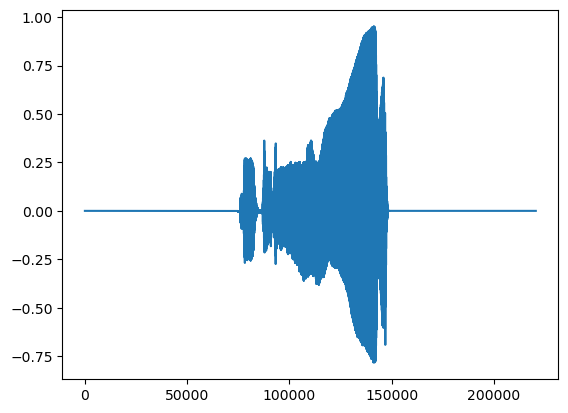

In [66]:
import importlib
importlib.reload(importlib.import_module('Preprocessing.exploration_plots'))
from Preprocessing.exploration_plots import one_random_audio
audio, samplerate = one_random_audio(main_dir, end= 220500)

The information about the dataset, including the file name, the file path, the class and the belonging to the ESC-10 or ESC-50 dataset are loaded in the following cell.

In [60]:
importlib.reload(importlib.import_module('Preprocessing.data_loader'))
from Preprocessing.data_loader import load_metadata
df_ESC10, df_ESC50 = load_metadata(main_dir, ESC_US = False, statistics=False)

,filename,fold,target,category,esc10,src_file,take,full_path
0,1-100032-A-0.wav,1,0,dog,True,100032,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...


Classes in the full dataset  are perfectly balanced
 Counter({'dog': 40, 'chirping_birds': 40, 'vacuum_cleaner': 40, 'thunderstorm': 40, 'door_wood_knock': 40, 'can_opening': 40, 'crow': 40, 'clapping': 40, 'fireworks': 40, 'chainsaw': 40, 'airplane': 40, 'mouse_click': 40, 'pouring_water': 40, 'train': 40, 'sheep': 40, 'water_drops': 40, 'church_bells': 40, 'clock_alarm': 40, 'keyboard_typing': 40, 'wind': 40, 'footsteps': 40, 'frog': 40, 'cow': 40, 'brushing_teeth': 40, 'car_horn': 40, 'crackling_fire': 40, 'helicopter': 40, 'drinking_sipping': 40, 'rain': 40, 'insects': 40, 'laughing': 40, 'hen': 40, 'engine': 40, 'breathing': 40, 'crying_baby': 40, 'hand_saw': 40, 'coughing': 40, 'glass_breaking': 40, 'snoring': 40, 'toilet_flush': 40, 'pig': 40, 'washing_machine': 40, 'clock_tick': 40, 'sneezing': 40, 'rooster': 40, 'sea_waves': 40, 'siren': 40, 'cat': 40, 'door_wood_creaks': 40, 'crickets': 40})


,filename,fold,target,category,src_file,take,full_path
0,1-100032-A-0.wav,1,0,dog,100032,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
14,1-110389-A-0.wav,1,0,dog,110389,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
24,1-116765-A-41.wav,1,41,chainsaw,116765,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
54,1-17150-A-12.wav,1,12,crackling_fire,17150,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...
55,1-172649-A-40.wav,1,40,helicopter,172649,A,/Users/leonardo/Desktop/HDA/Human_Data_Analyti...


Classes in ESC10 
 ['rain', 'chainsaw', 'crying_baby', 'helicopter', 'sea_waves', 'rooster', 'crackling_fire', 'dog', 'clock_tick', 'sneezing']


## 1.2 Spectrogram Analysis

Now we dig in the analysis, exploiting the natural structure of sound.
In particular we'll need the [Short-Time Fourier Transform](https://en.wikipedia.org/wiki/Short-time_Fourier_transform) and several other spectral transformations.

A segment of 40 ms has 1764 samples


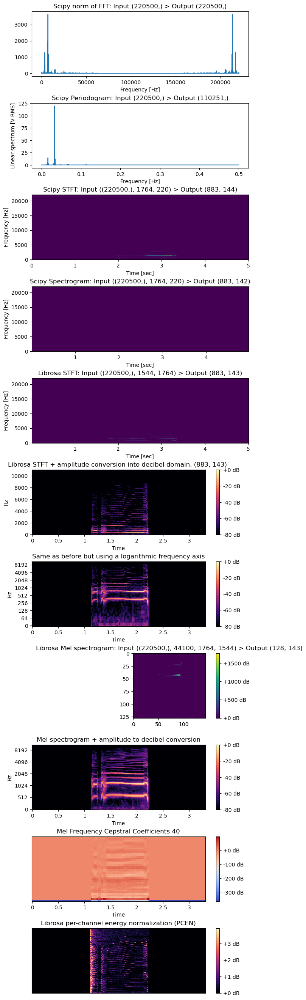

In [67]:
importlib.reload(importlib.import_module('Preprocessing.exploration_plots'))
from Preprocessing.exploration_plots import Spectral_Analysis
mfcc_audio = Spectral_Analysis(audio,
                               sample_rate = 44100,
                               segment = 40, #length of the segment in ms
                               n_fft = None, #padd the frames with zeros before DFT
                               overlapping = 5,
                               cepstral_num = 40, #number of mel frequencies cepstral coefficients
                               N_filters = 50, #number of mel filters in frequency domain
                               plot = True, #default is false
                               verbose = False, #default is false
                               STFT_decibel = False,
                               Mel_spectrogram_decibel = False,
                               MFCC = True)

From the prevoius analysis we can see that the most informative plots, from a human point of view, are the one produced by using STFT, MEL or MFCC transformation of the audio. Here there are 5 plots of preprocessed audio (STFTs of audio converted into decibel domain and in logarithm scale) for each class of our dataset. Changing the preprocessing parameters we can obtain different plots.

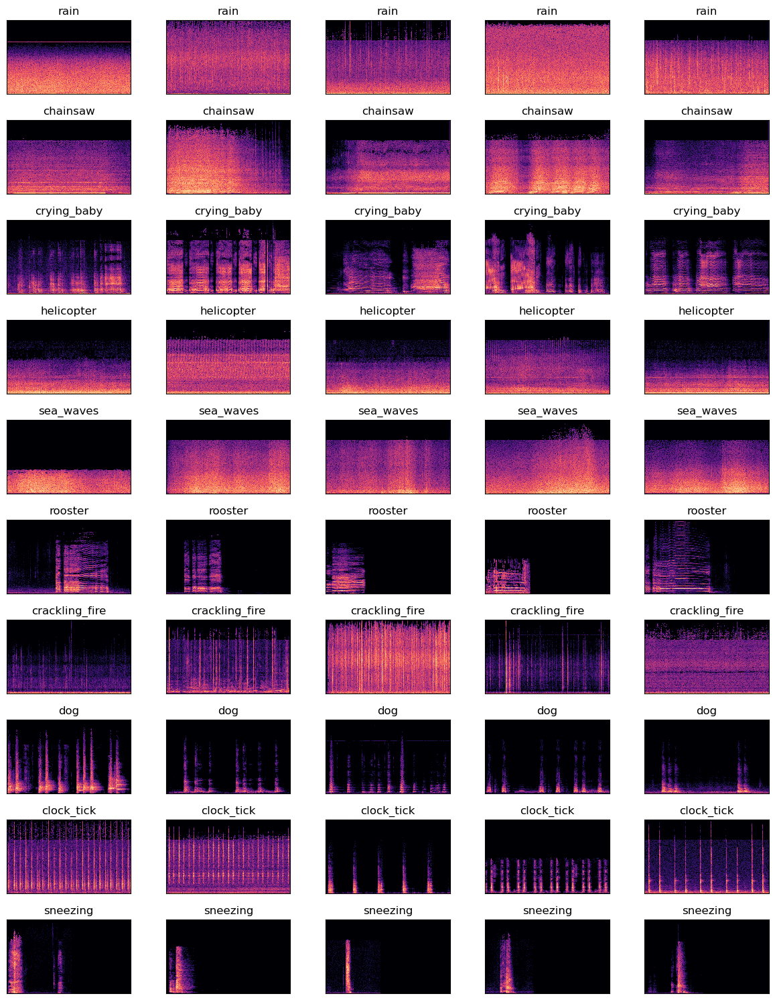

In [52]:
importlib.reload(importlib.import_module('Preprocessing.exploration_plots'))
from Preprocessing.exploration_plots import plot_clip_overview
plot_clip_overview(df_ESC10, preprocessing = 'STFT') #clearly you can pass only df_ESC10 or df_ESC50

We can appreciate a ramarkable amount of intra-class similarity but also a non trascurable amount of inter-class similarity.

# 2 SUPERVISED LEARNING

In this chapter we are going to perform some supervised learning on the dataset. We will use the basic machine learning models and the neural networks. Of particular interest and not without difficulty was the creation of a routine for the dataset suitable for our purposes. In particular:
-   In the basic ML section it was sufficient for us to convert the audios into numpy arrays, which in the case of the 50-class dataset means an array of size 2000 x 220500. 
This is already beyond the limits of our ram possibilities, but can easily be solved by changing the format for saving values from float64 to float16.
-   In the section on neural networks, with a view to reusing the same function to create much larger datasets for autoencoders (up to 250000 audio as opposed to 2000 for the dataset with labels) we followed the typical processing pipeline of tensorflow, which was also shown in the course labs.

## 2.1 Basic Machine Learning

As said  before, since our interest here is not in exhaustive research ofthe best non-neuroal machine learning models, but just in having a base line for our research, we are going to build Numpy arrays with our raw audio or with the matrix of MFCC flattend (avoiding the use of other preprocessing types).

We will use this strategy to implement the following basic machine-learning models:
- Logistic Regression
- SVM
- Decision Tree and Random Forest
- KNN

We will experiment  setting a 1/4 of the dataset as test set. To understand if the 10-class dataset is actually made of classes "well separeted" we also built another 10-classes dataset (with 10 random classes among the 50 available) to have another comparison of the performance of the models.

In [ ]:
importlib.reload(importlib.import_module('Preprocessing.data_loader'))
importlib.reload(importlib.import_module('Models.basic_ml'))
importlib.reload(importlib.import_module('Visualization.model_plot'))
from Preprocessing.data_loader import load_metadata
from Models.basic_ml import basic_ML_experiments, basic_ML_experiments_gridsearch, build_dataset, extract_flatten_MFCC
from Visualization.model_plot import confusion_matrix,listen_to_wrong_audio

Here we create the datasets as numpy arrays.

In [ ]:
X_ESC10, y_ESC10, labels10 = build_dataset(df_ESC10)
X_ESC50, y_ESC50, labels50 = build_dataset(df_ESC50)
df_subset, X_subset, y_subset, labels_subset = build_dataset(df_ESC50, subset = True, num_classes=10) # build a dataset of num_classes classes choosen among the 50 available


Loading the 400-th labelled audio.
To build the dataset we need 0.82 seconds seconds.
The Numpy Array of the dataset occupies 705600.128 kbytes
Loading the 400-th labelled audio.
Loading the 800-th labelled audio.
Loading the 1200-th labelled audio.
Loading the 1600-th labelled audio.
Loading the 2000-th labelled audio.
To build the dataset we need 4.02 seconds seconds.
The Numpy Array of the dataset occupies 3528000.128 kbytes
Random dataset with 10 classes built in 0.42 seconds seconds.
Classes choosen: {'pig', 'door_wood_knock', 'drinking_sipping', 'brushing_teeth', 'frog', 'engine', 'toilet_flush', 'mouse_click', 'cat', 'insects'}


This function runs several grid searches to find the best hyperparameters for the models.
The results are written in the file "grid_search_results.txt" in the "Models" folder.

In [ ]:
basic_ML_experiments_gridsearch(X_ESC10,y_ESC10, test_size = 0.25,
                                file = r'Models\grid_search_results.txt',# where to save the results
                                cv=3, #number of fold of the cross validation
                                verbose = False,
                                logistic_regression = False, # which models to run
                                SVM = False,
                                decision_tree = False,
                                random_forest = False,
                                KNN = False)

Now, for the different datasets created before, we trained the models with the best hyperparameters found in the grid search. The cell output concisely shows the results.

In [ ]:
results_ESC10 = basic_ML_experiments(X_ESC10, y_ESC10, test_size = 0.25,
                                     MFCC = True,
                                     raw_audio  =True,
                                     logistic_regression = True,
                                     SVM = True,
                                     decision_tree = True,
                                     random_forest = True,
                                     KNN = True)

The shape of the train and test set for the ESC10 dataset are:
train shape: (300, 220500), 	 target shape: (300,)
test shape: (100, 220500), 	 target shape: (100,)

               LOGISTIC REGRESSION

Fit the logistic regression on the ESC10 dataset with raw audio requires 12.04 seconds
(Logistic Regression) Accuracy on ESC10 training set with raw audio. 	: 1.0
(Logistic Regression) Accuracy on ESC10 test set with raw audio.	: 0.17

Fit the logistic regression on the ESC10 dataset with 20-MFCC and 160 filters requires 7.05 seconds
(Logistic Regression) Accuracy on ESC10 training set with 20-MFCC and 160 filters. 	: 1.0
(Logistic Regression) Accuracy on ESC10 test set with 20-MFCC and 160 filters.	: 0.73

               SVM

Using raw audio with SVM is unfeasible

Fit the SVM on the ESC10 dataset with 50-MFCC and 160 filters requires 1.13 seconds
(SVM) Accuracy on ESC10 training set with 50 MFCC and 160 filters. 	: 1.0
(SVM) Accuracy on ESC10 test set with 50 MFCC and 160 filters.	: 0.7

In [ ]:
# test on 10 random classes and not with the 10 well separated of ESC10
results_subset = basic_ML_experiments(X_subset, y_subset)

The shape of the train and test set for the random10 dataset are:
train shape: (300, 220500), 	 target shape: (300,)
test shape: (100, 220500), 	 target shape: (100,)

               LOGISTIC REGRESSION

Fit the logistic regression on the random10 dataset with raw audio requires 35.78 seconds
(Logistic Regression) Accuracy on random10 training set with raw audio. 	: 1.0
(Logistic Regression) Accuracy on random10 test set with raw audio.	: 0.2

Fit the logistic regression on the random10 dataset with 20-MFCC and 160 filters requires 6.15 seconds
(Logistic Regression) Accuracy on random10 training set with 20-MFCC and 160 filters. 	: 1.0
(Logistic Regression) Accuracy on random10 test set with 20-MFCC and 160 filters.	: 0.67

               SVM

Using raw audio with SVM is unfeasible

Fit the SVM on the random10 dataset with 50-MFCC and 160 filters requires 1.51 seconds
(SVM) Accuracy on random10 training set with 50 MFCC and 160 filters. 	: 1.0
(SVM) Accuracy on random10 test set with 5

In [ ]:
results_ESC50 = basic_ML_experiments(X_ESC50, y_ESC50)

The shape of the train and test set for the ESC50 dataset are:
train shape: (1500, 220500), 	 target shape: (1500,)
test shape: (500, 220500), 	 target shape: (500,)

               LOGISTIC REGRESSION

Fit the logistic regression on the ESC50 dataset with raw audio requires 333.78 seconds
(Logistic Regression) Accuracy on ESC50 training set with raw audio. 	: 1.0
(Logistic Regression) Accuracy on ESC50 test set with raw audio.	: 0.05

Fit the logistic regression on the ESC50 dataset with 20-MFCC and 160 filters requires 81.35 seconds
(Logistic Regression) Accuracy on ESC50 training set with 20-MFCC and 160 filters. 	: 1.0
(Logistic Regression) Accuracy on ESC50 test set with 20-MFCC and 160 filters.	: 0.398

               SVM

Using raw audio with SVM is unfeasible

Fit the SVM on the ESC50 dataset with 50-MFCC and 160 filters requires 34.71 seconds
(SVM) Accuracy on ESC50 training set with 50 MFCC and 160 filters. 	: 1.0
(SVM) Accuracy on ESC50 test set with 50 MFCC and 160 filters.

Here the results are summarized in a table. We can see that the best model is the SVM, which in the next cell we are going to build and train again to show a better visualization of the results.

In [ ]:
results_ESC50

Logistic Regression              SVM        Random Forest  \
                         raw audio   MFCC raw audio   MFCC     raw audio   
train accuracy                1.00  1.000         0  1.000         1.000   
test accuracy                 0.05  0.398         0  0.422         0.084   

                      Decision Tree              KNN         
                 MFCC     raw audio   MFCC raw audio   MFCC  
train accuracy  0.904      0.148667  0.438  0.024667  1.000  
test accuracy   0.356      0.030000  0.142  0.016000  0.328

Extract the MFCC requires 34.99 seconds.
Fit the SVM on the ESC50 dataset with 50-MFCC and 160 filters requires 57.14 seconds
(SVM) Accuracy on ESC50 training set with 50-MFCC and 160 filters. 	: 1.0
(SVM) Accuracy on ESC50 test set with 50-MFCC and 160 filters.	: 0.472


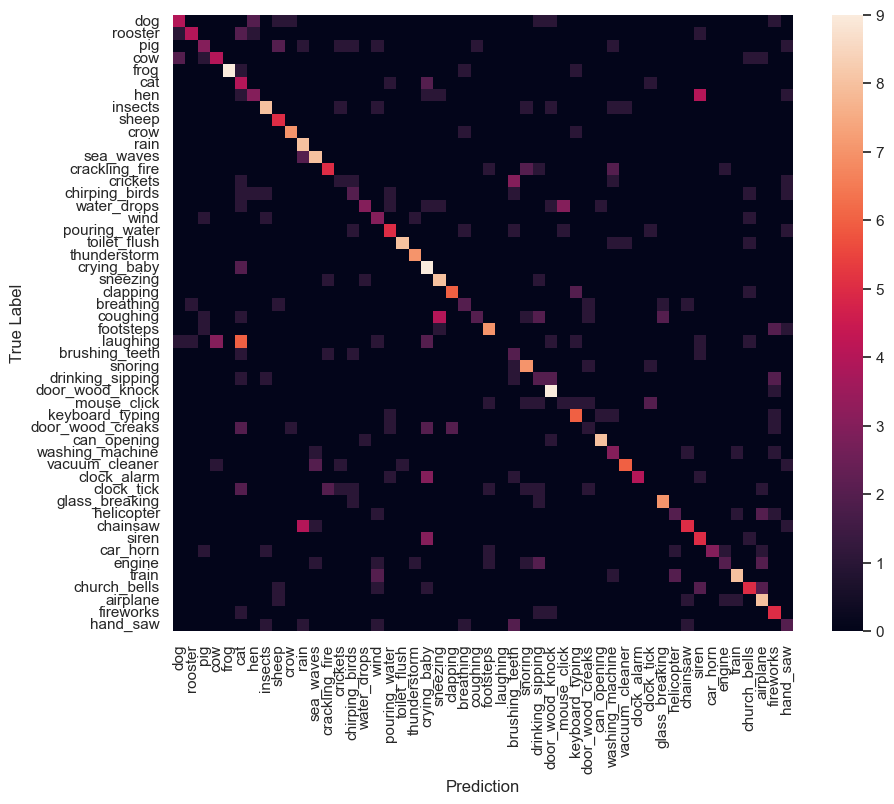

The most misclassified class is cat
Audio category: cat


The are more audio predicted as cat then actually is:
Audio category misclassified as cat: laughing


In [ ]:
# show only the best model
mfcc = 50 #40, 30
N_filters = 160 #80,40
C = 100 # 10, 1
kernel = 'rbf'
#kernel = 'poly'
#gamma = 1
#degree = 2
test_size = 0.25
name_df = 'ESC50'

# train test split
X_train, X_test, y_train, y_test = train_test_split(X_ESC50, y_ESC50, test_size=test_size, random_state=123)

#mfcc extraction
start_time = time.time()
X_train_mfcc = np.apply_along_axis(lambda x: extract_flatten_MFCC(audio = x, cepstral_num = mfcc, N_filters = N_filters), 1, X_train)
X_test_mfcc = np.apply_along_axis(lambda x: extract_flatten_MFCC(audio = x, cepstral_num = mfcc, N_filters = N_filters), 1, X_test)
print(f'Extract the MFCC requires {round(time.time()-start_time,2)} seconds.')

#fit the model
start_time = time.time()
pipe = make_pipeline(StandardScaler(), SVC(C = C, kernel = kernel ,random_state=123))
pipe.fit(X_train_mfcc,y_train)
print(f'Fit the SVM on the {name_df} dataset with {mfcc}-MFCC and {N_filters} filters requires {round(time.time()-start_time,2)} seconds')

#accuracy on train and test
y_predict_train = pipe.predict(X_train_mfcc)
y_predict_test = pipe.predict(X_test_mfcc)
print(f"(SVM) Accuracy on {name_df} training set with {mfcc}-MFCC and {N_filters} filters. \t: {accuracy_score(y_train, y_predict_train)}")
print(f"(SVM) Accuracy on {name_df} test set with {mfcc}-MFCC and {N_filters} filters.\t: {accuracy_score(y_test, y_predict_test)}")

#confusion matrix
confusion_mtx = confusion_matrix(y_test, y_predict_test, labels50)

#listen to wrong audio
listen_to_wrong_audio(df_ESC50, y_test, y_predict_test, confusion_mtx = confusion_mtx , labels = labels50) #, n_audio = 2)



## 2.2 Fully Connected Neural Networks

In this section, we will proceed with the construction and training of multiple fully connected neural networks. It is important to note that our motivation for doing so is primarily comparative. This decision arises from the understanding that employing a Feedforward Neural Network (FFNN) with 220,500 variables while having only 40 samples per class is not prudent due to the limitations posed by such a scenario.

Furthermore, in the context of the dataset consisting of 50 classes, the feasibility of conducting a grid search is severely restricted. To address this, we have opted to utilize the optimal parameter configuration derived from the grid search conducted on the 10-class dataset. We intend to employ a similar approach for the majority of the subsequent models. From our perspective, this strategy is well-founded. It is based on the premise that the most suitable model configuration should remain consistent across both datasets, as it is contingent upon the inherent characteristics of the audio content rather than the quantity of classes present.

### 2.2.1 Fully connected - Raw Audio - 10 classes

In [ ]:
importlib.reload(importlib.import_module('Models.ann_utils'))
from Models.ann_utils import create_dataset, compile_and_fit, example_batch, compile_fit_evaluate, K_fold_training

The subsequent procedure will be replicated several times throughout our examination of each specific class of models and will not be commented any more:

1.  Creation of the dataset, encompassing all requisite preprocessing steps (for this instance, we utilize the raw audio data).
2.   Design and instantiation of the model, typically facilitated through a dedicated function often denoted as build_model.
3.   Execution of a Grid Search aimed at identifying the optimal hyperparameters (in this chapter we'll employ the scikeras library).
4.   Construction of the model with the most favorable hyperparameter configuration as determined by the Hyperparameter Optimization (HPO) process and subsequent training and evaluation. It is worth noting that this step will generally involve a more data than the preceding stages, especiallt in for the Autoencoder models for which we had almost 250000 audio files.

This entire procedure is executed using the ESC-10 dataset. Subsequently, for the ESC-50 dataset, steps 2 and 4 are omitted, given that the optimal hyperparameters are already established (as said before).

#### Create the dataset

Audio shape: (30, 220500)
Label shape: (30, 10)
Label: dog


2023-08-24 15:22:12.944623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [400]
	 [[{{node Placeholder/_0}}]]
2023-08-24 15:22:12.944818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-08-24 15:22:13.014075: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pip

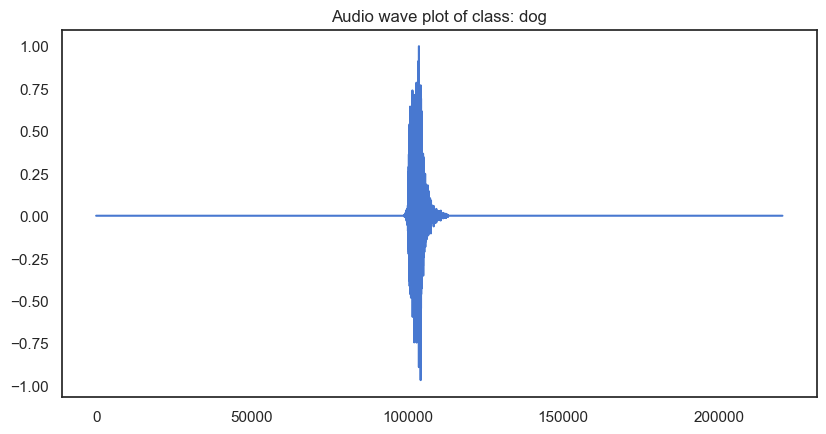

In [ ]:
batch_size = 30

dataset, label = create_dataset_lite(df_ESC10,
                                     batch_size = batch_size,
                                     preprocessing = None,
                                     ndim = 1
    )
INPUT_DIM, n_labels = example_batch(dataset, label_names = list(label.columns))


#### Build the model

In [ ]:
def build_model( n_labels=n_labels,   # arguments to build the model
                 INPUT_DIM= INPUT_DIM,
                 n_units = [64],
                 activation = 'relu',
                 dropout = 0.5,
                 #arguments to compile the model
                 loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                 optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=1e-3) if (sys.platform == 'darwin' or in_colab) else tf.keras.optimizers.Adam(learning_rate=1e-3),
                 metrics = ['accuracy']):

    model = tf.keras.models.Sequential([tf.keras.layers.Flatten(input_shape=INPUT_DIM)], name = 'Flatten_ANN')
    for unit in n_units:
        model.add(tf.keras.layers.Dense(unit, activation=activation))
        model.add(tf.keras.layers.Dropout(dropout))
    model.add(tf.keras.layers.Dense(n_labels, activation='softmax'))

    model.compile(loss = loss,
                  optimizer = optimizer,
                  metrics = metrics)

    return model

#### Run a grid search to find the best params

In [ ]:
epochs = 100
patience = 20
params = {'n_units':[[64],[128],[64,128],[8,8,16]], 'activation':['relu','tanh','elu'], 'dropout':[0.5,0.3,0.1]}
K_fold = 5

model_cv, result, best_params = K_fold_training(dataset, build_model, params = params, epochs = epochs, patience = patience, verbose = 1, K=K_fold)


2023-08-24 15:22:15.453755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [400]
	 [[{{node Placeholder/_0}}]]
2023-08-24 15:22:15.454047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]


(400, 220500)
(400, 10)
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Epoch 1/100
10/10 [==============================] - 1s 48ms/step - loss: 2.5817 - accuracy: 0.0969
Epoch 2/100
10/10 [==============================] - 0s 31ms/step - loss: 1.3807 - accuracy: 0.6906
Epoch 3/100
10/10 [==============================] - 0s 21ms/step - loss: 1.0420 - accuracy: 0.7906
Epoch 4/100
10/10 [==============================] - 0s 22ms/step - loss: 0.8216 - accuracy: 0.8406
Epoch 5/100
10/10 [==============================] - 0s 23ms/step - loss: 0.6455 - accuracy: 0.8750
Epoch 6/100
10/10 [==============================] - 0s 27ms/step - loss: 0.4509 - accuracy: 0.9250
Epoch 7/100
10/10 [==============================] - 0s 22ms/step - loss: 0.8832 - accuracy: 0.9125
Epoch 8/100
10/10 [==============================] - 0s 22ms/step - loss: 0.7712 - accuracy: 0.9219
Epoch 9/100
10/10 [==============================] - 0s 24ms/step - loss: 0.4457 - accuracy: 0.9500
Epoch 10/100
1

,mean_accuracy
"{'activation': 'relu', 'dropout': 0.3, 'n_units': [64, 128]}",0.2400
"{'activation': 'elu', 'dropout': 0.3, 'n_units': [128]}",0.2025
"{'activation': 'relu', 'dropout': 0.5, 'n_units': [64]}",0.1925
"{'activation': 'relu', 'dropout': 0.1, 'n_units': [64, 128]}",0.1925
"{'activation': 'elu', 'dropout': 0.1, 'n_units': [64]}",0.1925
"{'activation': 'relu', 'dropout': 0.5, 'n_units': [64, 128]}",0.1875
"{'activation': 'elu', 'dropout': 0.5, 'n_units': [128]}",0.1875
"{'activation': 'elu', 'dropout': 0.3, 'n_units': [64, 128]}",0.1825
"{'activation': 'elu', 'dropout': 0.5, 'n_units': [64]}",0.1800
"{'activation': 'relu', 'dropout': 0.1, 'n_units': [64]}",0.1750


In [ ]:
#best_params = {'activation': 'relu', 'dropout': 0.3, 'n_units': [64, 128]}
print("The best params are:", {key: value for key, value in best_params.items() if key != 'INPUT_DIM'})

# save the best_params in pickle

with open(os.path.join(main_dir,'Models','best_params_RAW_FC_10c_221.pickle'), 'wb') as handle:
    pickle.dump(best_params, handle, protocol=pickle.HIGHEST_PROTOCOL)

The best params are: {'activation': 'relu', 'dropout': 0.3, 'n_units': [64, 128]}


#### Train the model with best HP

In [ ]:
#best_params = {'activation': 'relu', 'n_units': 64}	#best parameters from the grid search
ESC10_path = os.path.join(main_dir,'data', 'ESC-10-depth')
batch_size = 30
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(ESC10_path,
                                                                    batch_size = batch_size,
                                                                    shuffle = True,
                                                                    validation_split = 0.25, # this is the splitting of train vs validation + test
                                                                    show_example_batch = True,
                                                                    verbose = 0
                                                                    )

Found 400 files belonging to 10 classes.
Using 300 files for training.
Using 100 files for validation.


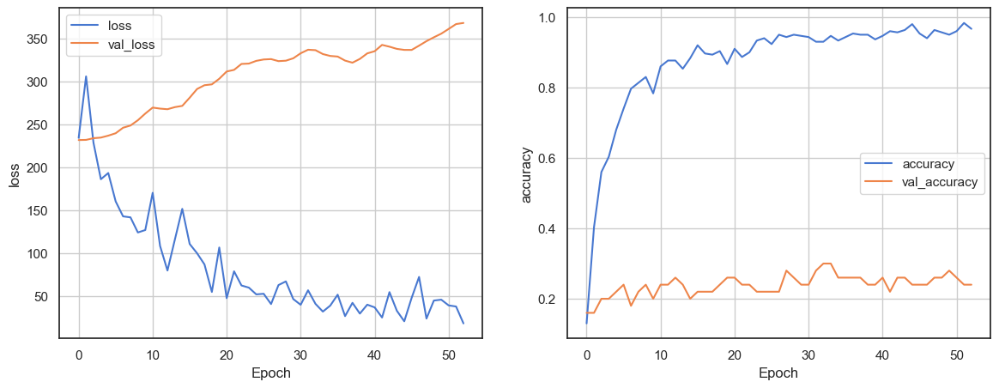

2/2 [==============================] - 2s 593ms/step - loss: 3.5195 - accuracy: 0.1600


{'loss': 3.519547700881958, 'accuracy': 0.1599999964237213}

2/2 [==============================] - 0s 16ms/step


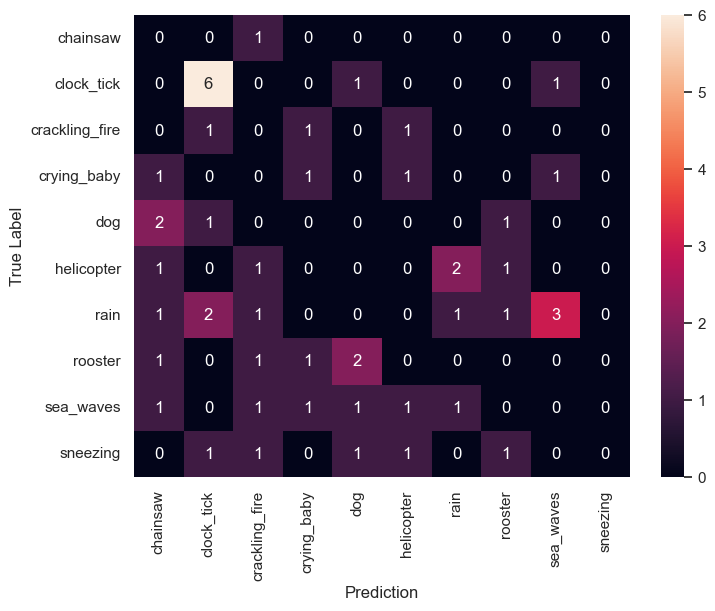

The most misclassified class is chainsaw
Audio category: chainsaw


The are more audio predicted as chainsaw then actually is:
Audio category misclassified as chainsaw: dog


In [ ]:
model = build_model(**best_params)

epochs = 100
patience = 20
#steps_per_epoch = np.ceil(300/batch_size) #needed only if we used the repeat method
model, history, confusion_mtx, evaluation = compile_fit_evaluate(df_ESC10, model, train, val,test,label_names,
                                                                epochs = epochs,
                                                                patience = patience,
                                                                verbose = 0,
                                                                show_history = True,
                                                                show_test_evaluation = True,
                                                                show_confusion_matrix = True,
                                                                listen_to_wrong = True)

### 2.2.2 Fully Connected - Raw Audio - 50 classes

In [ ]:
importlib.reload(importlib.import_module('Models.ann_utils'))
from Models.ann_utils import create_dataset, compile_and_fit, example_batch, compile_fit_evaluate, K_fold_training, create_dataset_lite

#### Create the dataset

In [ ]:
# refit the model with the best parameters on the whole dataset
ESC50_path = os.path.join(main_dir,'data', 'ESC-50-depth')
batch_size = 30
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(ESC50_path,
                                                                    batch_size = batch_size,
                                                                    shuffle = True,
                                                                    validation_split = 0.25, # this is the splitting of train vs validation + test
                                                                    show_example_batch = True,
                                                                    verbose = 0
                                                                    )

Found 2000 files belonging to 50 classes.
Using 1500 files for training.
Using 500 files for validation.


#### Train the model

Model: "Flatten_ANN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_490 (Flatten)       (None, 220500)            0         
                                                                 
 dense_1240 (Dense)          (None, 64)                14112064  
                                                                 
 dropout_750 (Dropout)       (None, 64)                0         
                                                                 
 dense_1241 (Dense)          (None, 128)               8320      
                                                                 
 dropout_751 (Dropout)       (None, 128)               0         
                                                                 
 dense_1242 (Dense)          (None, 50)                6450      
                                                                 
Total params: 14,126,834
Trainable params: 14,126,834
N

2023-08-24 16:16:43.820623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-08-24 16:16:43.821230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_18' with dtype float
	 [[{{node Placeholder/_18}}]]


49/50 [============================>.] - ETA: 0s - loss: 4.2247 - accuracy: 0.0170

2023-08-24 16:16:46.225517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-08-24 16:16:46.231733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


50/50 [==============================] - 3s 57ms/step - loss: 4.2235 - accuracy: 0.0167 - val_loss: 4.2590 - val_accuracy: 0.0280
Epoch 2/100
50/50 [==============================] - 2s 38ms/step - loss: 5.3037 - accuracy: 0.1467 - val_loss: 4.3038 - val_accuracy: 0.0400
Epoch 3/100
50/50 [==============================] - 2s 39ms/step - loss: 5.0940 - accuracy: 0.2440 - val_loss: 4.2975 - val_accuracy: 0.0360
Epoch 4/100
50/50 [==============================] - 2s 37ms/step - loss: 4.8624 - accuracy: 0.3127 - val_loss: 4.2847 - val_accuracy: 0.0520
Epoch 5/100
 9/50 [====>.........................] - ETA: 1s - loss: 3.2889 - accuracy: 0.3889

50/50 [==============================] - 2s 36ms/step - loss: 4.1167 - accuracy: 0.3900 - val_loss: 4.3152 - val_accuracy: 0.0320
Epoch 6/100
50/50 [==============================] - 3s 58ms/step - loss: 3.8259 - accuracy: 0.4287 - val_loss: 4.2849 - val_accuracy: 0.0400
Epoch 7/100
50/50 [==============================] - 3s 66ms/step - loss: 3.4665 - accuracy: 0.5100 - val_loss: 4.3966 - val_accuracy: 0.0400
Epoch 8/100
50/50 [==============================] - 3s 51ms/step - loss: 3.5178 - accuracy: 0.5427 - val_loss: 4.4771 - val_accuracy: 0.0360
Epoch 9/100
50/50 [==============================] - 2s 46ms/step - loss: 3.2098 - accuracy: 0.5580 - val_loss: 4.4394 - val_accuracy: 0.0440
Epoch 10/100
50/50 [==============================] - 2s 41ms/step - loss: 3.4249 - accuracy: 0.6013 - val_loss: 4.4263 - val_accuracy: 0.0480
Epoch 11/100
50/50 [==============================] - 2s 42ms/step - loss: 2.7167 - accuracy: 0.6067 - val_loss: 4.4643 - val_accuracy: 0.0400
Epoch 12/100
50/

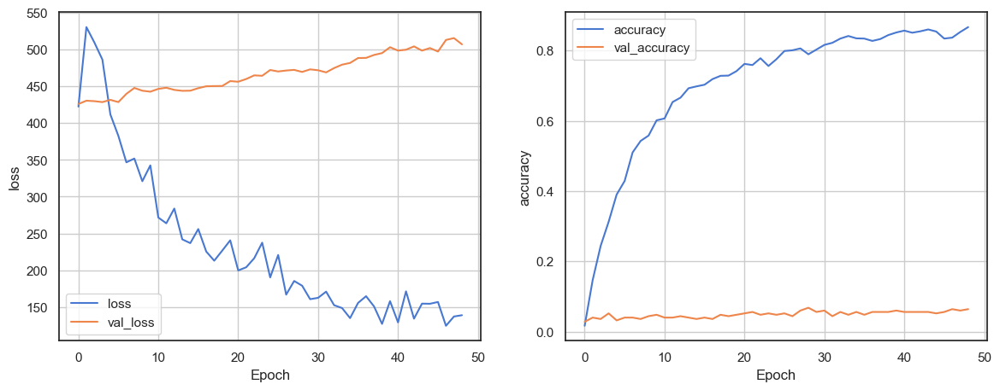

2023-08-24 16:18:12.136204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-08-24 16:18:12.136851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


9/9 [==============================] - 1s 44ms/step - loss: 4.6913 - accuracy: 0.0440


{'loss': 4.691315650939941, 'accuracy': 0.04399999976158142}

9/9 [==============================] - 0s 10ms/step


2023-08-24 16:18:12.902865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-08-24 16:18:12.903415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]


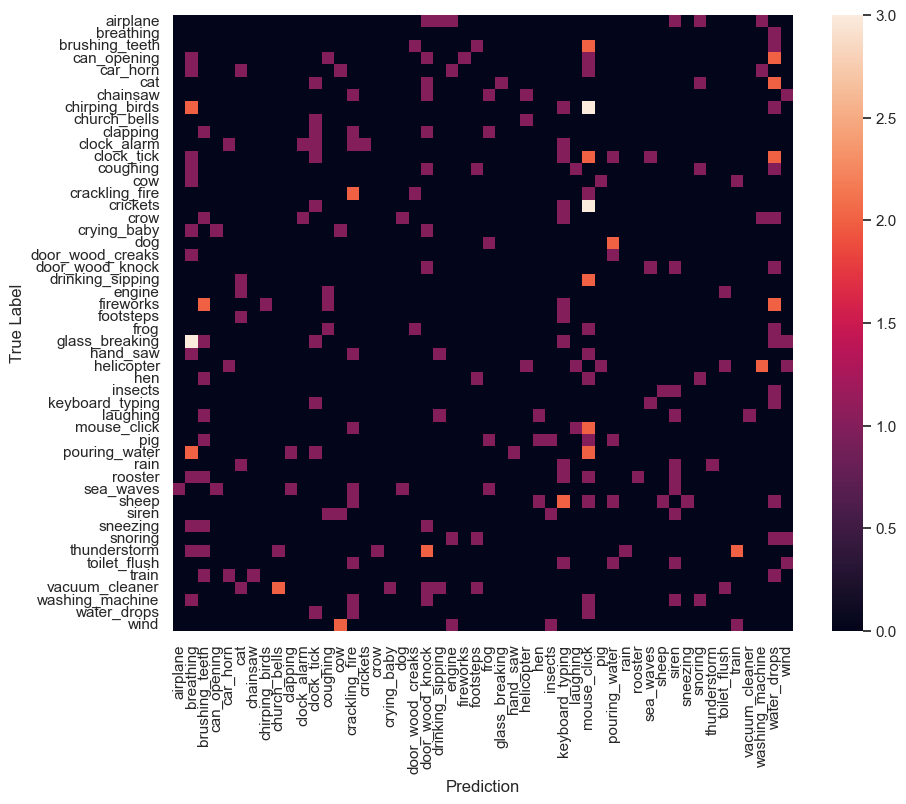

The most misclassified class is mouse_click
Audio category: mouse_click


The are more audio predicted as mouse_click then actually is:
Audio category misclassified as mouse_click: crickets


In [ ]:
model = build_model(n_labels = n_labels, **best_params)

epochs = 100
patience = 20
model, history, confusion_mtx, evaluation = compile_fit_evaluate(df_ESC50, model, train, val,test,label_names,
                                                                epochs = epochs,
                                                                patience = patience,
                                                                optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=1e-3) if sys.platform == 'darwin' else tf.keras.optimizers.Adam(learning_rate=1e-3),
                                                                verbose = 1,
                                                                show_history = True,
                                                                show_test_evaluation = True,
                                                                show_confusion_matrix = True,
                                                                listen_to_wrong = True)

## 2.3 Convolutional Neural Networks

Within this section, we will use Convolutional Neural Networks (CNNs) for the classification of audio files. To accomplish this, we will leverage the ESC-10 dataset, subjecting the audio to three distinct preprocessing methodologies. For each preprocessing technique, we will execute a comprehensive grid search, fine-tuning the parameters to identify optimal configurations. Importantly, the parameters under consideration will remain consistent across the various preprocessing strategies. Ultimately, our aim is to conduct a comparative analysis of the outcomes obtained from these different preprocessing routes. Subsequently, we will narrow our focus to the most promising model, employing the finest preprocessing methodology, and apply it to the ESC-50 dataset for further training and evaluation. This progression ensures that our efforts are guided by a systematic exploration of preprocessing variations, leading us to the optimal model for the subsequent stages of our investigation.

### 2.3.1 CNN - STFT Preprocessed Audio

In [2]:
importlib.reload(importlib.import_module('Models.ann_utils'))
from Models.ann_utils import create_dataset, compile_fit_evaluate, K_fold_training, create_dataset_lite

#### Create the dataset ESC-10

Preprocessing: STFT


2023-09-03 16:26:59.752293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-03 16:26:59.780621: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


The max value is 80.0
Audio shape: (30, 501, 442, 1)
Label shape: (30, 10)
Label: dog


2023-09-03 16:27:01.017102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-03 16:27:01.017349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-03 16:27:01.153596: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input p

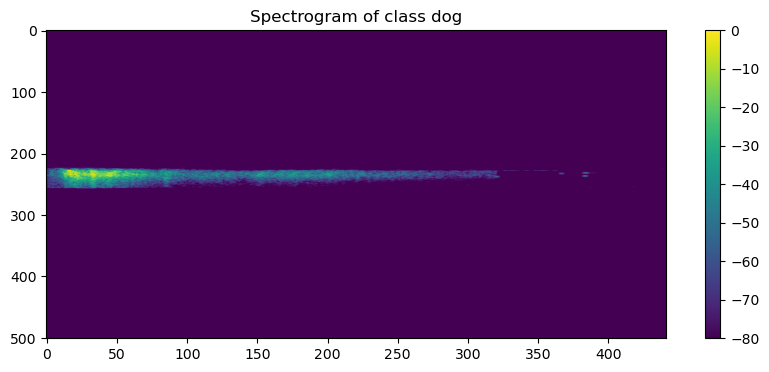

In [3]:
batch_size = 30

dataset, label = create_dataset_lite(df_ESC10,
                                     batch_size = batch_size,
                                     preprocessing = 'STFT',
                                     ndim = 3, )

INPUT_DIM, n_labels = example_batch(dataset, label_names = list(label.columns))

#### Build the model

We are going to keep this function for sections 2.3.2, 2.3.3 and 2.3.4 to avoid repeating the code

In [4]:
def build_model(n_labels = n_labels,   # arguments to build the model
                 INPUT_DIM = INPUT_DIM,
                 n_units = 8,
                 kernel_size = (3,3),
                 activation = 'relu',
                 #arguments to compile the model
                 loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                 learning_rate = 1e-3,
                 metrics = ['accuracy'],
                 verbose = 0,
                 compile = True):

    model = tf.keras.models.Sequential([
        # Convolutional layer 1
        tf.keras.layers.Conv2D(n_units, kernel_size, strides = 2 ,activation=activation, input_shape=INPUT_DIM, padding="same"),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

        # Convolutional layer 2
        tf.keras.layers.Conv2D(2*n_units, (3, 3), strides = 2 ,  activation=activation, padding="same"),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

        # Convolutional layer 3
        tf.keras.layers.Conv2D(4*n_units, (3, 3), activation=activation, padding="same"),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten the output of the previous layer
        tf.keras.layers.Flatten(),

        # Dense layer for classification
        tf.keras.layers.Dense(n_labels, activation='softmax')  # Assuming 10 classes for classification
    ], name = 'CNN')

    if compile:
        model.compile(loss = loss,
                    optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate) if sys.platform == 'darwin' or in_colab else tf.keras.optimizers.Adam(learning_rate=learning_rate),
                    metrics = metrics)
        if verbose > 0 :
            model.summary()

    print(f'n_units {n_units}, activation {activation}, learning_rate {learning_rate}, kernel size {kernel_size}')

    return model

#### Run a grid search to find the best params

In [ ]:
epochs = 40
patience = 5
params = {'INPUT_DIM' : [INPUT_DIM],'n_units':[16,32], 'activation':['relu','tanh'], 'learning_rate':[1e-3, 1e-4], 'kernel_size':[(3,3), (5,5)]}
K_fold = 4

model_cv, result, best_params = K_fold_training(dataset, build_model, params = params, epochs =  epochs, patience = patience, verbose = 0, K=K_fold)

(400, 501, 442, 1)
(400, 10)


n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.57
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.69
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.71
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.66
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.64
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.73
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.61
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.67
n_units 16, activation relu, learning_rate 0.0001, kernel size (3, 3)
accuracy on test for this fold is 0.57
n_units 16, activation relu

,mean_accuracy
"{'INPUT_DIM': (501, 442, 1), 'activation': 'relu', 'kernel_size': (5, 5), 'learning_rate': 0.001, 'n_units': 32}",0.7275
"{'INPUT_DIM': (501, 442, 1), 'activation': 'relu', 'kernel_size': (5, 5), 'learning_rate': 0.0001, 'n_units': 32}",0.7050
"{'INPUT_DIM': (501, 442, 1), 'activation': 'relu', 'kernel_size': (5, 5), 'learning_rate': 0.001, 'n_units': 16}",0.6925
"{'INPUT_DIM': (501, 442, 1), 'activation': 'tanh', 'kernel_size': (5, 5), 'learning_rate': 0.001, 'n_units': 32}",0.6850
"{'INPUT_DIM': (501, 442, 1), 'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_units': 32}",0.6825
"{'INPUT_DIM': (501, 442, 1), 'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32}",0.6625
"{'INPUT_DIM': (501, 442, 1), 'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 16}",0.6575
"{'INPUT_DIM': (501, 442, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32}",0.6400
"{'INPUT_DIM': (501, 442, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 16}",0.6375
"{'INPUT_DIM': (501, 442, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_units': 32}",0.6225


In [ ]:
print("The best params are:", {key: value for key, value in best_params.items() if key != 'INPUT_DIM'})

# save the best_params in pickle
with open(os.path.join(main_dir,'Models','best_params_CNN_STFT_231.pickle'), 'wb') as handle:
    pickle.dump(best_params, handle, protocol=pickle.HIGHEST_PROTOCOL)

The best params are: {'activation': 'relu', 'kernel_size': (5, 5), 'learning_rate': 0.001, 'n_units': 32}


#### Train the best model on ESC-50

In [7]:
#refit only the best model on ESC-50
seed = 42
tf.random.set_seed(seed)
ESC50_path = os.path.join(main_dir,'data', 'ESC-50-depth')
batch_size = 30
preprocessing = 'STFT'

train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(ESC50_path,
                                                verbose = 0,
                                                batch_size = batch_size,
                                                validation_split = 0.25, # this is the splitting of train vs validation + test
                                                normalize = True, # normalization preprocessing (default is true)
                                                preprocessing = preprocessing,   # "STFT", "MEL", "MFCC" or None
                                                show_example_batch = True,
                                                ndim=3)


Found 2000 files belonging to 50 classes.


Using 1500 files for training.
Using 500 files for validation.


2023-09-03 07:01:07.946334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]
2023-09-03 07:01:07.946614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-03 07:01:22.375707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_21' with dtype float
	 [[{{node Place

In [8]:
# upload the best parameters
with open(os.path.join(main_dir,'Models','best_params_CNN_STFT_231.pickle'), 'rb') as handle:
    best_params = pickle.load(handle)

n_units 32, activation relu, learning_rate 0.001, kernel size (5, 5)
Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 251, 221, 32)      832       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 125, 110, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 63, 55, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 31, 27, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 31, 27, 128)       73856     
                                                            

2023-09-03 07:01:35.456965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_21' with dtype float
	 [[{{node Placeholder/_21}}]]
2023-09-03 07:01:35.457580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]


50/50 [==============================] - ETA: 0s - loss: 3.9071 - accuracy: 0.0247

2023-09-03 07:02:05.166929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-03 07:02:05.167300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


50/50 [==============================] - 33s 642ms/step - loss: 3.9071 - accuracy: 0.0247 - val_loss: 3.8526 - val_accuracy: 0.0280
Epoch 2/50
50/50 [==============================] - 30s 594ms/step - loss: 3.5244 - accuracy: 0.0973 - val_loss: 3.4853 - val_accuracy: 0.0760
Epoch 3/50
50/50 [==============================] - 30s 598ms/step - loss: 2.9808 - accuracy: 0.1960 - val_loss: 2.7978 - val_accuracy: 0.2600
Epoch 4/50
50/50 [==============================] - 30s 598ms/step - loss: 2.4358 - accuracy: 0.3387 - val_loss: 2.6493 - val_accuracy: 0.2440
Epoch 5/50
50/50 [==============================] - 30s 592ms/step - loss: 2.0701 - accuracy: 0.4280 - val_loss: 2.2984 - val_accuracy: 0.3520
Epoch 6/50
50/50 [==============================] - 30s 602ms/step - loss: 1.7214 - accuracy: 0.5073 - val_loss: 2.4062 - val_accuracy: 0.3400
Epoch 7/50
50/50 [==============================] - 30s 603ms/step - loss: 1.4031 - accuracy: 0.6027 - val_loss: 2.0565 - val_accuracy: 0.4400
Epoch 8/50

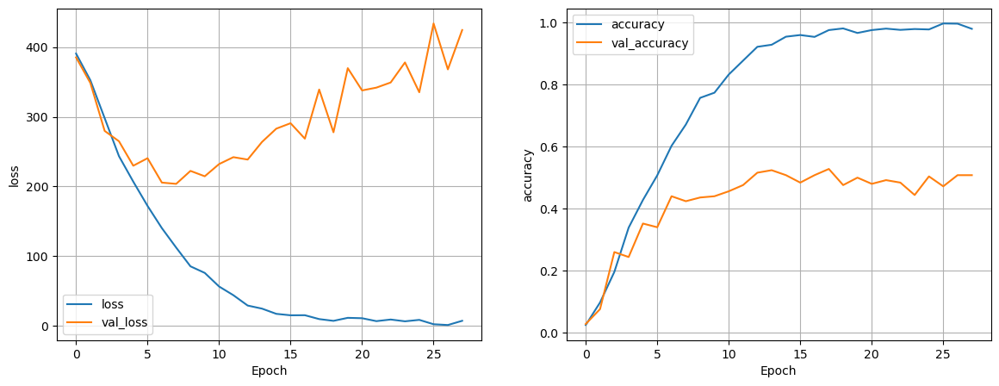

2023-09-03 07:12:48.032914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]
2023-09-03 07:12:48.033241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]


9/9 [==============================] - 2s 195ms/step - loss: 3.8087 - accuracy: 0.5240


{'loss': 3.808703899383545, 'accuracy': 0.5239999890327454}

9/9 [==============================] - 1s 95ms/step


2023-09-03 07:12:51.072696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]
2023-09-03 07:12:51.073024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]


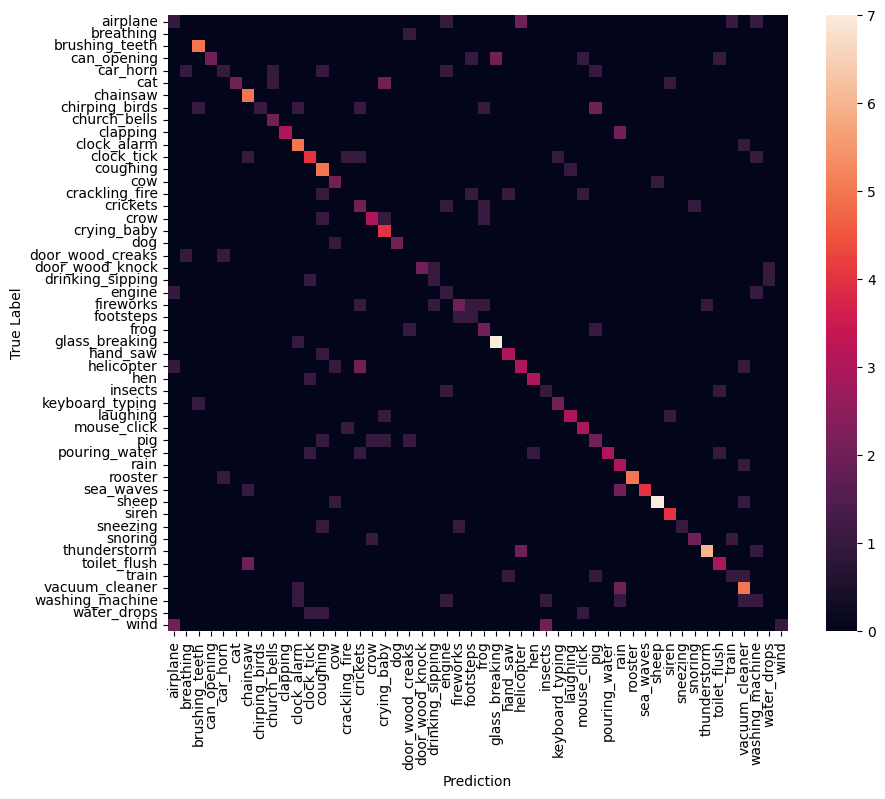

The most misclassified class is chirping_birds
Audio category: chirping_birds


The are more true chirping_birds audio than the predicted ones:
Some chirping_birds are classified as airplane, which is, for example:


In [9]:
#build the model
model = build_model(n_labels = n_labels, compile = False, **best_params)

epochs = 50
patience = 10 # early stopping patience
lr = best_params['learning_rate']
model, hisotry, confusion_mtx, evaluation = compile_fit_evaluate(df_ESC50, model, train, val, test, label_names,
                                     epochs = epochs,
                                     patience = patience,
                                     loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                                     optimizer =tf.keras.optimizers.legacy.Adam(learning_rate=lr) if sys.platform == 'darwin' or in_colab else tf.keras.optimizers.Adam(learning_rate=lr),
                                     metrics = ['accuracy'],
                                     verbose = 1,
                                     show_history = True,
                                     show_test_evaluation = True,
                                     show_confusion_matrix = True,
                                     listen_to_wrong = True)


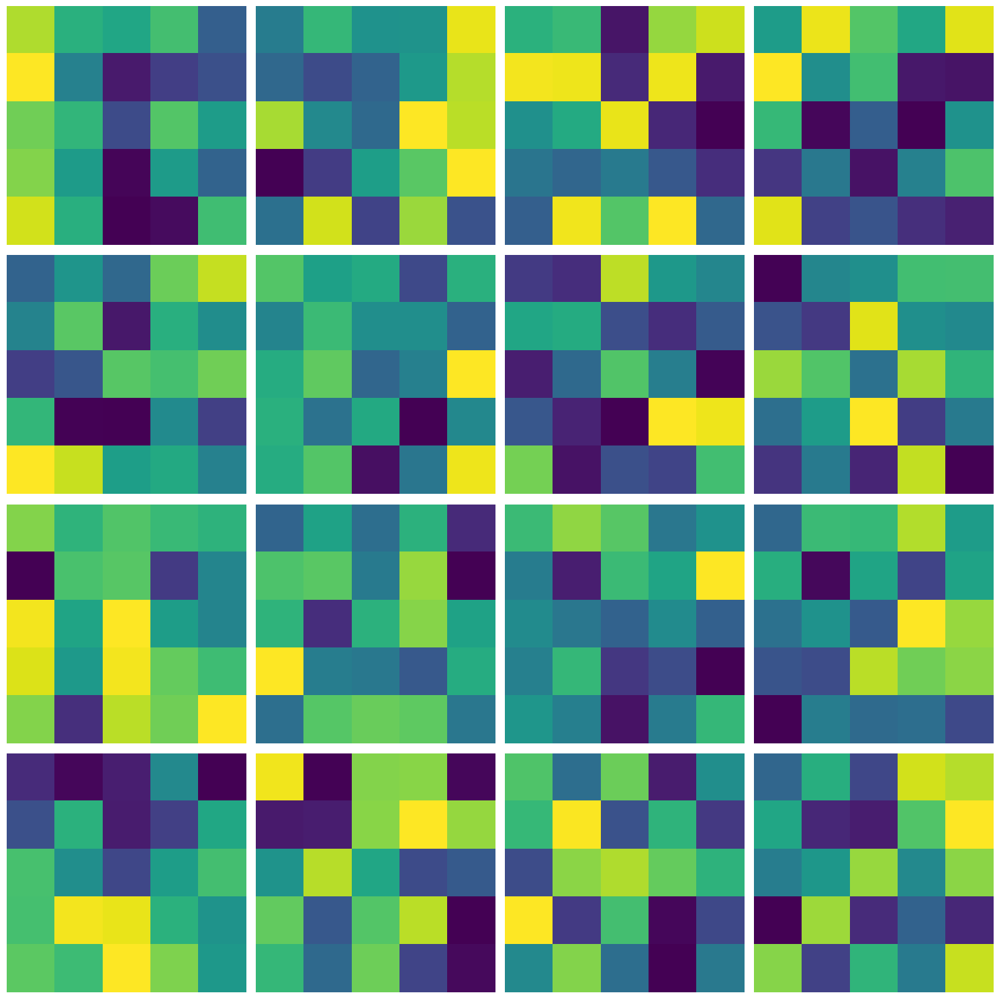

In [10]:
#show the weights of the first layer
visualize_the_weights(model, layer_number = 0, n_filters = 16, verbose = 0)

In [11]:
save_model_path = os.path.join(main_dir,'Saved_Models','ESC50_simple_CNN_STFT')
# save the model
model.save(save_model_path, save_format  ='keras')


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT/assets


#### Train the best model on augmented data

In the data_augmentation notebook starting with ESC-50 we created 20 other equally large datasets, half of them with time masks and the other half with frequency masks. Now we try to train the best model resulting from gridsearch on the augmented dataset. 

Load the already trained simple CNN STFT model which was trained on ESC-50. 

In [5]:
# Define the path to the saved model
saved_model_path = os.path.join(main_dir, 'Saved_Models', 'ESC50_simple_CNN_STFT')

# Load the model
loaded_model = tf.keras.models.load_model(saved_model_path)

Duplicate it so we will be able to compare the results

In [6]:
save_model_path = os.path.join(main_dir,'Saved_Models','ESC50_simple_CNN_STFT_Augmented')
# save the model
loaded_model.save(save_model_path, save_format  ='keras')

INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Upload the best parameters for the model to use into the build function

In [7]:
with open(os.path.join(main_dir,'Models','best_params_CNN_STFT_231.pickle'), 'rb') as handle:
    best_params = pickle.load(handle)

We are going to use val and test set from the ESC-50 original dataset but train is going to be a masked_dataset

In [8]:
#refit only the best model on ESC-50
seed = 42
tf.random.set_seed(seed)
ESC50_path = os.path.join(main_dir,'data', 'ESC-50-depth')
batch_size = 30
preprocessing = 'STFT'

train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(ESC50_path,
                                                verbose = 0,
                                                batch_size = batch_size,
                                                validation_split = 0.25, # this is the splitting of train vs validation + test
                                                normalize = True, # normalization preprocessing (default is true)
                                                preprocessing = preprocessing,   # "STFT", "MEL", "MFCC" or None
                                                show_example_batch = True,
                                                ndim=3)

Found 2000 files belonging to 50 classes.
Using 1500 files for training.
Using 500 files for validation.


2023-09-03 16:27:05.764524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]
2023-09-03 16:27:05.764692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-03 16:27:12.701064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_21' with dtype float
	 [[{{node Place

Working on time_mask3
Training the model on the masked dataset:  time_mask3


2023-09-03 16:27:43.810253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]
2023-09-03 16:27:43.810732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  1
Working on time_mask4
Training the model on the masked dataset:  time_mask4


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  2
Working on freq_mask2
Training the model on the masked dataset:  freq_mask2


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  3
Working on freq_mask5
Training the model on the masked dataset:  freq_mask5


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  4
Working on time_mask5
Training the model on the masked dataset:  time_mask5


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  5
Working on time_mask2
Training the model on the masked dataset:  time_mask2


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  6
Working on freq_mask4
Training the model on the masked dataset:  freq_mask4


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  7
Working on freq_mask3
Training the model on the masked dataset:  freq_mask3


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  8
Working on freq_mask8
Training the model on the masked dataset:  freq_mask8


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  9
Working on freq_mask6
Training the model on the masked dataset:  freq_mask6


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  10
Working on freq_mask1
Training the model on the masked dataset:  freq_mask1


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  11
Working on time_mask9
Training the model on the masked dataset:  time_mask9


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  12
Working on time_mask7
Training the model on the masked dataset:  time_mask7


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  13
Working on time_mask0
Training the model on the masked dataset:  time_mask0


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  14
Working on freq_mask0
Training the model on the masked dataset:  freq_mask0


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  15
Working on freq_mask7
Training the model on the masked dataset:  freq_mask7


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  16
Working on freq_mask9
Training the model on the masked dataset:  freq_mask9


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  17
Working on time_mask1
Training the model on the masked dataset:  time_mask1


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  18
Working on time_mask6
Training the model on the masked dataset:  time_mask6


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  19
Working on time_mask8
Training the model on the masked dataset:  time_mask8


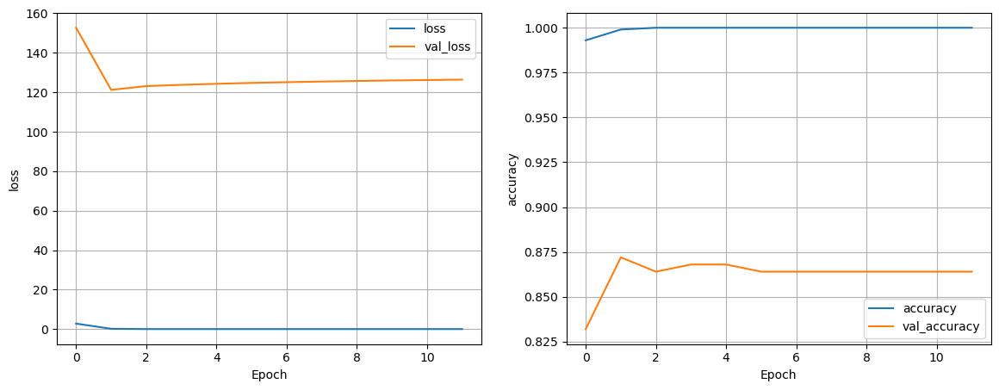

2023-09-03 19:47:58.612641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-03 19:47:58.615197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


9/9 [==============================] - 3s 333ms/step - loss: 0.7659 - accuracy: 0.8960


{'loss': 0.7658514380455017, 'accuracy': 0.8960000276565552}

9/9 [==============================] - 2s 168ms/step


2023-09-03 19:48:03.515380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-09-03 19:48:03.516130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


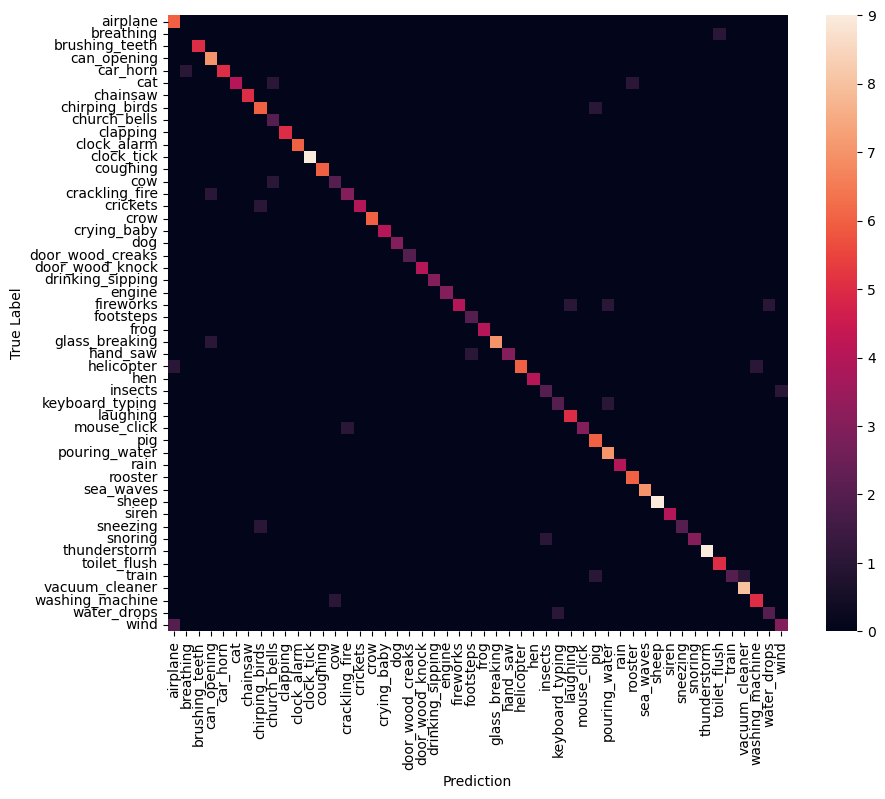

The most misclassified class is airplane
Audio category: airplane


The are more audio predicted as airplane then actually is:
Audio category misclassified as airplane: wind


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_STFT_Augmented/assets


Number of masked dataset trained:  20


In [9]:
# Around 12 min to run 50 epochs on one masked dataset (we have 20)
from Models.ann_utils import create_masked_dataset

#create a log of the training or load the existing one:
log_dir = os.path.join(main_dir,'Logs_Masked')

list_masked_dataset = os.listdir(os.path.join(main_dir,'Saved_Datasets', 'masked_dataset'))
if '.DS_Store' in list_masked_dataset:
    list_masked_dataset.remove('.DS_Store')

for dataset_name in list_masked_dataset:
    print(f'Working on {dataset_name}')

    #stuff with the log
    if not os.path.exists(log_dir):
        os.mkdir(log_dir)
    # if log dir is empty
    if not os.listdir(log_dir):
        # create dictionary with the name of the dataset as key and False as value
        dict_dataset = {dataset:False for dataset in list_masked_dataset}
        # save the best_params in pickle
        with open(os.path.join(main_dir,'Logs_Masked','dict_masked_dataset.pickle'), 'wb') as handle:
            pickle.dump(dict_dataset, handle, protocol=pickle.HIGHEST_PROTOCOL)
    else :
        with open(os.path.join(main_dir,'Logs_Masked','dict_masked_dataset.pickle'), 'rb') as handle:
            dict_dataset = pickle.load(handle)


    # start the real training
    if not dict_dataset[dataset_name]:
        print("Training the model on the masked dataset: ", dataset_name)
        #loading the masked dataset
        dataset_path = os.path.join(main_dir,'Saved_Datasets', 'masked_dataset',dataset_name)
        masked_dataset = tf.data.Dataset.load(dataset_path)
        
        # preprocessing into train_masked
        train_masked = create_masked_dataset(dataset_path, batch_size = 30, normalize = True, verbose = 0)

        # load ESC50_simple_CNN_STFT_Augmented
        saved_model_path = os.path.join(main_dir, 'Saved_Models', 'ESC50_simple_CNN_STFT_Augmented')
        loaded_model = tf.keras.models.load_model(saved_model_path)

        #compile, fit and evaluate
        epochs = 50
        patience = 10 # early stopping patience
        lr = best_params['learning_rate']

        #last folder check
        s = sum(dict_dataset.values())
        if s == len(list_masked_dataset)-1:
            show_history = True
            show_test_evaluation = True
            show_confusion_matrix = True
            listen_to_wrong = True
        else: 
            show_history = False
            show_test_evaluation = False
            show_confusion_matrix = False
            listen_to_wrong = False

        # note that the dataframe df_ESC50 does not create any problem in this framework (it is not used)
        output = compile_fit_evaluate(df_ESC50, loaded_model, train_masked, val, test, label_names,
                                            epochs = epochs,
                                            patience = patience,
                                            loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                                            optimizer =tf.keras.optimizers.legacy.Adam(learning_rate=lr) if sys.platform == 'darwin' or in_colab else tf.keras.optimizers.Adam(learning_rate=lr),
                                            metrics = ['accuracy'],
                                            verbose = 0,
                                            show_history = show_history,
                                            show_test_evaluation = show_test_evaluation,
                                            show_confusion_matrix = show_confusion_matrix,
                                            listen_to_wrong = listen_to_wrong)
        
        if s == len(list_masked_dataset)-1:
            model, hisotry, confusion_mtx, evaluation = output[0], output[1], output[2], output[3]
        else: 
            model, hisotry = output[0], output[1]
        
        # save the model
        save_model_path = os.path.join(main_dir,'Saved_Models','ESC50_simple_CNN_STFT_Augmented')
        model.save(save_model_path, save_format  ='keras')

        # update the log
        dict_dataset[dataset_name] = True

        # save the log
        with open(os.path.join(main_dir,'Logs_Masked','dict_masked_dataset.pickle'), 'wb') as handle:
            pickle.dump(dict_dataset, handle, protocol=pickle.HIGHEST_PROTOCOL)

    else: 
        print(f'The model has already been trained on {dataset_name}')
    
    print("Number of masked dataset trained: ", sum(dict_dataset.values()))
        

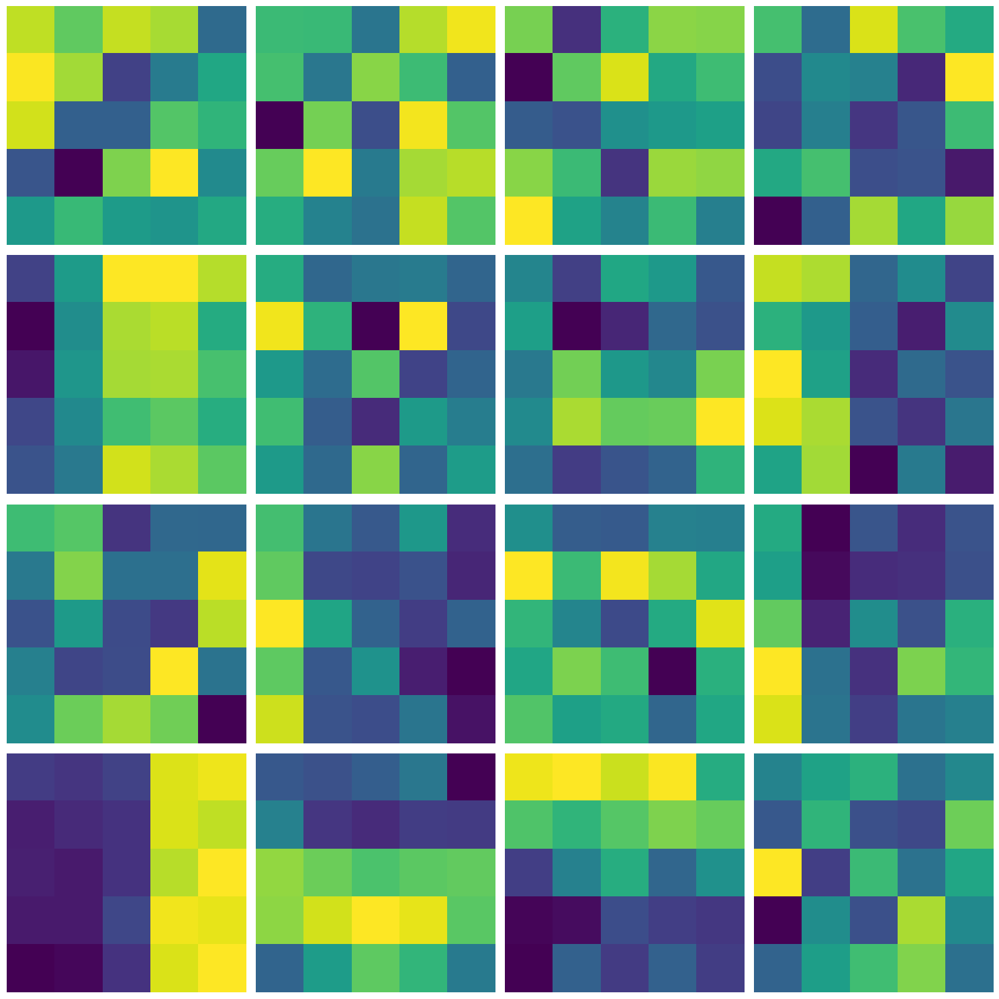

In [10]:
#show the weights of the first layer
visualize_the_weights(model, layer_number = 0, n_filters = 16, verbose = 0)

In [13]:
# load the dictionary
with open(os.path.join(main_dir,'Logs_Masked','dict_masked_dataset.pickle'), 'rb') as handle:
    dict_dataset_see = pickle.load(handle)

dict_dataset_see #see if all the datasets have been trained

{'time_mask3': True,
 'time_mask4': True,
 'freq_mask2': True,
 'freq_mask5': True,
 'time_mask5': True,
 'time_mask2': True,
 'freq_mask4': True,
 'freq_mask3': True,
 'freq_mask8': True,
 'freq_mask6': True,
 'freq_mask1': True,
 'time_mask9': True,
 'time_mask7': True,
 'time_mask0': True,
 'freq_mask0': True,
 'freq_mask7': True,
 'freq_mask9': True,
 'time_mask1': True,
 'time_mask6': True,
 'time_mask8': True}

### 2.3.2 CNN - MEL Preprocessed Audio

In [30]:
importlib.reload(importlib.import_module('Models.ann_utils'))
from Models.ann_utils import create_dataset, compile_fit_evaluate, K_fold_training, create_dataset_lite

#### Create the dataset ESC-10

In [31]:
batch_size = 30

dataset, label = create_dataset_lite(df_ESC10,
                                     batch_size = batch_size,
                                     preprocessing = 'MEL',
                                     ndim = 3,
                                     verbose = 0)
INPUT_DIM, n_labels = example_batch(dataset, label_names = list(label.columns), verbose = 0)

2023-09-01 00:41:50.273339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-01 00:41:50.413139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [400]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:41:50.413329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [400]

#### Run a grid search to find the best params

In [ ]:
epochs = 40
patience = 5
params = {'INPUT_DIM' : [INPUT_DIM],'n_units':[16, 32], 'activation':['relu','tanh'], 'learning_rate':[1e-3, 1e-4], 'kernel_size':[(3,3), (7,7)]}
K_fold = 4

model_cv, result, best_params = K_fold_training(dataset, build_model, params = params, epochs = epochs, patience = patience, verbose = 0, K=K_fold)


(400, 501, 128, 1)
(400, 10)
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.76
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.77
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.81
n_units 16, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.7
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.76
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.75
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.82
n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.73
n_units 16, activation relu, learning_rate 0.0001, kernel size (3, 3)
accuracy on test for this fold is 0.6


,mean_accuracy
"{'INPUT_DIM': (501, 128, 1), 'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32}",0.7650
"{'INPUT_DIM': (501, 128, 1), 'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 16}",0.7600
"{'INPUT_DIM': (501, 128, 1), 'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32}",0.7550
"{'INPUT_DIM': (501, 128, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 16}",0.7425
"{'INPUT_DIM': (501, 128, 1), 'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.0001, 'n_units': 32}",0.7350
"{'INPUT_DIM': (501, 128, 1), 'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 16}",0.7325
"{'INPUT_DIM': (501, 128, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32}",0.7300
"{'INPUT_DIM': (501, 128, 1), 'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32}",0.7250
"{'INPUT_DIM': (501, 128, 1), 'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.0001, 'n_units': 32}",0.7175
"{'INPUT_DIM': (501, 128, 1), 'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_units': 32}",0.7150


In [ ]:
print("The best params are:", {key: value for key, value in best_params.items() if key != 'INPUT_DIM'})

# save the best_params in pickle
with open(os.path.join(main_dir,'Models','best_params_CNN_MEL_232.pickle'), 'wb') as handle:
    pickle.dump(best_params, handle, protocol=pickle.HIGHEST_PROTOCOL)

The best params are: {'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32}


#### Train the best model on ESC-50

In [32]:
#refit only the best model on ESC-50
seed = 42
tf.random.set_seed(seed)
ESC50_path = os.path.join(main_dir,'data', 'ESC-50-depth')
batch_size = 30
preprocessing = 'MEL'

train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(ESC50_path,
                                                verbose = 0,
                                                batch_size = batch_size,
                                                validation_split = 0.25, # this is the splitting of train vs validation + test
                                                normalize = True, # normalization preprocessing (default is true)
                                                preprocessing = preprocessing,   # "STFT", "MEL", "MFCC" or None
                                                show_example_batch = True,
                                                ndim=3)


Found 2000 files belonging to 50 classes.


Using 1500 files for training.
Using 500 files for validation.


2023-09-01 00:41:52.906001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:41:52.906183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-01 00:42:14.182500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]

In [33]:
# load the best parameters
with open(os.path.join(main_dir,'Models','best_params_CNN_MEL_232.pickle'), 'rb') as handle:
    best_params = pickle.load(handle)

n_units 32, activation relu, learning_rate 0.001, kernel size (3, 3)
Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 251, 64, 32)       320       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 125, 32, 32)      0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 63, 16, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 31, 8, 64)        0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 31, 8, 128)        73856     
                                                            

Epoch 1/50


2023-09-01 00:42:37.485144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_21' with dtype float
	 [[{{node Placeholder/_21}}]]
2023-09-01 00:42:37.485463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]


50/50 [==============================] - ETA: 0s - loss: 3.9018 - accuracy: 0.0300

2023-09-01 00:42:41.090585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:42:41.090901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]


50/50 [==============================] - 7s 140ms/step - loss: 3.9018 - accuracy: 0.0300 - val_loss: 3.8112 - val_accuracy: 0.0520
Epoch 2/50
50/50 [==============================] - 4s 73ms/step - loss: 3.3799 - accuracy: 0.1133 - val_loss: 3.1501 - val_accuracy: 0.1640
Epoch 3/50
50/50 [==============================] - 4s 85ms/step - loss: 2.7885 - accuracy: 0.2393 - val_loss: 2.6800 - val_accuracy: 0.2720
Epoch 4/50
50/50 [==============================] - 4s 76ms/step - loss: 2.3795 - accuracy: 0.3327 - val_loss: 2.5939 - val_accuracy: 0.2680
Epoch 5/50
50/50 [==============================] - 4s 74ms/step - loss: 2.1223 - accuracy: 0.4000 - val_loss: 2.3934 - val_accuracy: 0.3520
Epoch 6/50
50/50 [==============================] - 4s 77ms/step - loss: 1.8014 - accuracy: 0.4873 - val_loss: 2.2658 - val_accuracy: 0.3440
Epoch 7/50
50/50 [==============================] - 4s 80ms/step - loss: 1.5805 - accuracy: 0.5440 - val_loss: 2.0714 - val_accuracy: 0.4360
Epoch 8/50
50/50 [=====

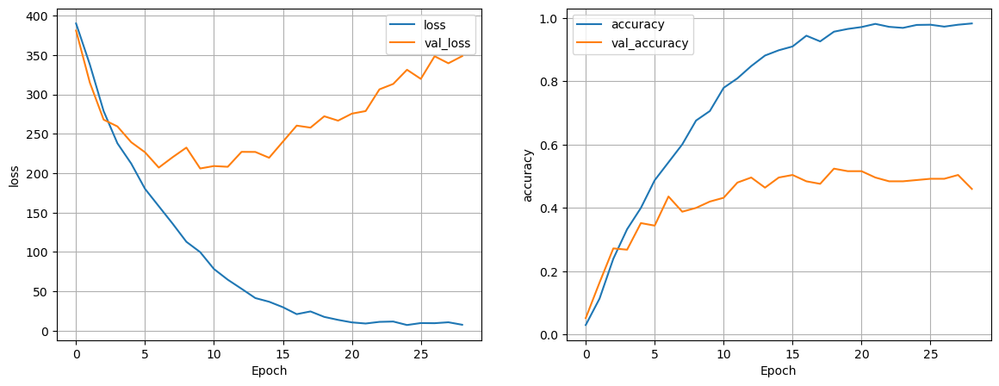

2023-09-01 00:44:39.074030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:44:39.074332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


9/9 [==============================] - 4s 475ms/step - loss: 2.8260 - accuracy: 0.4840


{'loss': 2.825981855392456, 'accuracy': 0.48399999737739563}

9/9 [==============================] - 0s 31ms/step


2023-09-01 00:44:43.723302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]
2023-09-01 00:44:43.723631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]


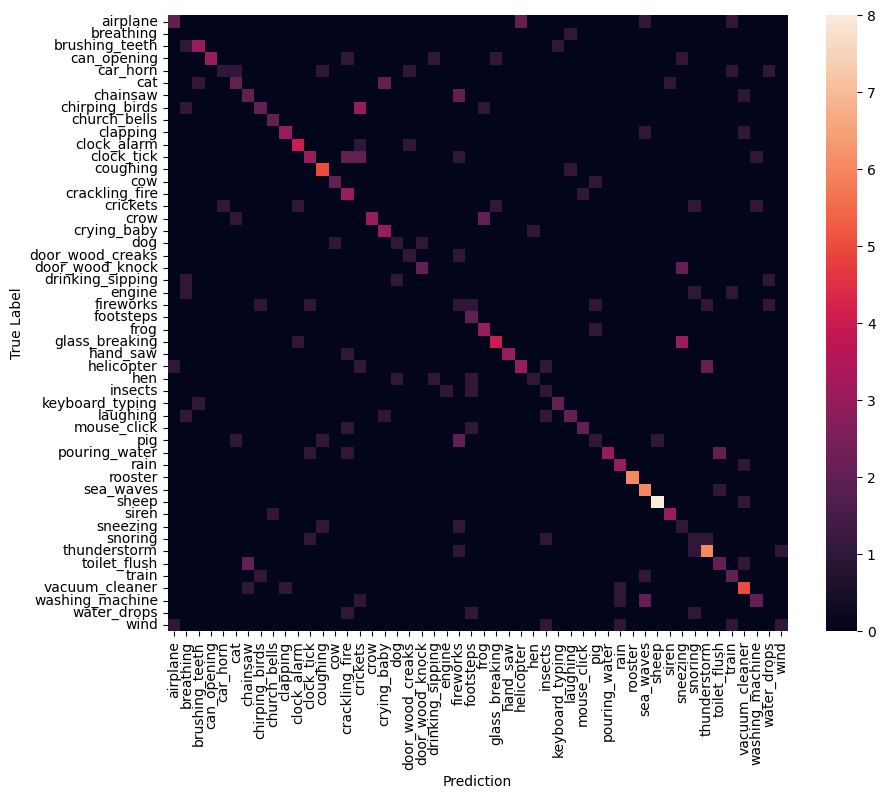

The most misclassified class is crackling_fire
Audio category: crackling_fire


The are more audio predicted as crackling_fire then actually is:
Audio category misclassified as crackling_fire: clock_tick


In [34]:
#build the model
model = build_model(n_labels = n_labels, compile = False, **best_params)

epochs = 50
patience = 10 # early stopping patience
lr = best_params['learning_rate']
model, hisotry, confusion_mtx, evaluation = compile_fit_evaluate(df_ESC50, model, train, val, test, label_names,
                                     epochs = epochs,
                                     patience = patience,
                                     loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                                     optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=lr) if sys.platform == 'darwin' else tf.keras.optimizers.Adam(learning_rate=lr),
                                     metrics = ['accuracy'],
                                     verbose = 1,
                                     show_history = True,
                                     show_test_evaluation = True,
                                     show_confusion_matrix = True,
                                     listen_to_wrong = True)



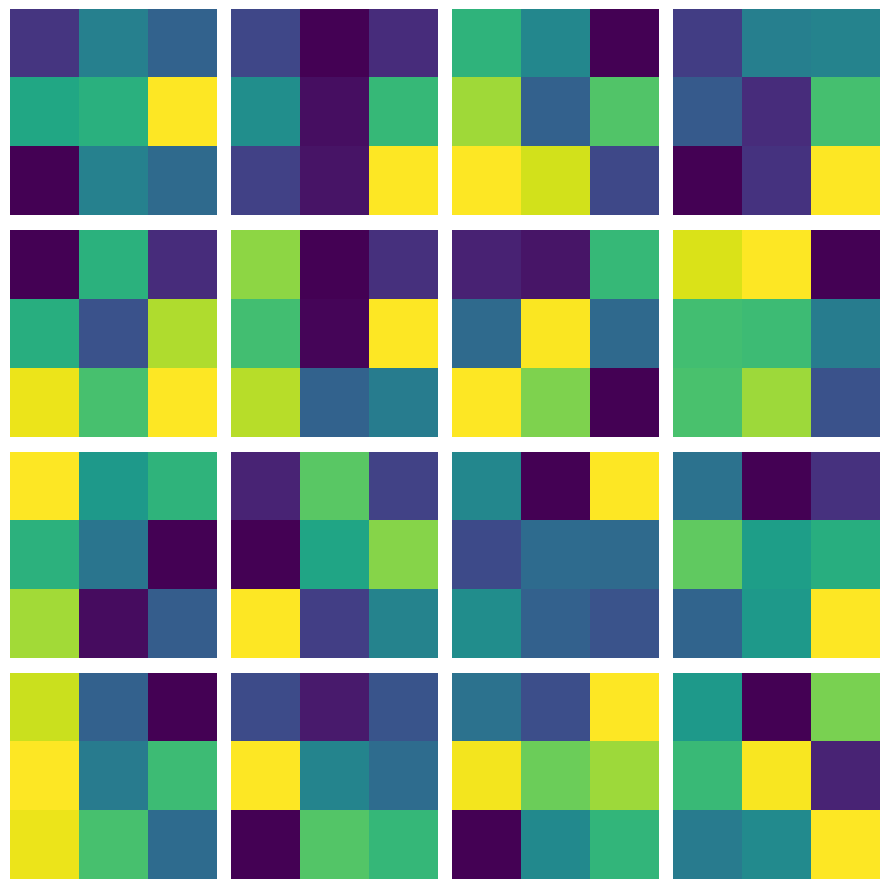

In [35]:
#show the weights of the first layer
visualize_the_weights(model, layer_number = 0, n_filters = 16, verbose = 0)

In [36]:
save_model_path = os.path.join(main_dir,'Saved_Models','ESC50_simple_CNN_MEL')
# save the model
model.save(save_model_path, save_format  ='keras')

INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_MEL/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_MEL/assets


### 2.3.3 CNN - MFCC Preprocessed Audio

In [37]:
importlib.reload(importlib.import_module('Models.ann_utils'))
from Models.ann_utils import create_dataset, compile_fit_evaluate, K_fold_training, create_dataset_lite

#### Create the dataset ESC-10

We tested also without delta or delta-delta coefficients and the best results were achieved including both of them in the preprocessing.

In [38]:
batch_size = 30
preprocessing = 'MFCC'
delta = True
delta_delta = True
dataset, label = create_dataset_lite(df_ESC10,
                                     batch_size = batch_size,
                                     preprocessing = preprocessing,
                                     delta = delta,
                                     delta_delta = delta_delta,
                                     ndim = 3 )
INPUT_DIM, n_labels = example_batch(dataset, label_names = list(label.columns), verbose = 0)

Preprocessing: MFCC


2023-09-01 00:44:44.797626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]


The max value is 475.30206298828125


2023-09-01 00:44:45.025206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-01 00:44:45.025413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [400]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:44:45.431917: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pip

#### Run a grid search to find the best params

In [ ]:
epochs = 40
patience = 5
params = {'INPUT_DIM' : [INPUT_DIM],'n_units':[64, 128], 'activation':['tanh'], 'learning_rate':[1e-3, 1e-4], 'kernel_size':[(3,3), (7,7)]}
#params = {'INPUT_DIM' : [INPUT_DIM],'n_units':[64], 'activation':['relu'], 'learning_rate':[1e-3, 1e-4], 'kernel_size':[(3,3)]}
K_fold = 4

model_cv, result, best_params = K_fold_training(dataset, build_model, params = params, epochs =  epochs, patience = patience, verbose = 0, K=K_fold)

(400, 501, 120, 1)
(400, 10)
n_units 64, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.64
n_units 64, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.78
n_units 64, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.78
n_units 64, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.71
n_units 128, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.68
n_units 128, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.74
n_units 128, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.77
n_units 128, activation tanh, learning_rate 0.001, kernel size (3, 3)
accuracy on test for this fold is 0.78
n_units 64, activation tanh, learning_rate 0.0001, kernel size (3, 3)
accuracy on test for this fold is

,mean_accuracy
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.0001, 'n_units': 128}",0.7550
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.0001, 'n_units': 64}",0.7450
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 128}",0.7425
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_units': 128}",0.7400
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64}",0.7350
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_units': 64}",0.7300
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 128}",0.7300
"{'INPUT_DIM': (501, 120, 1), 'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64}",0.7275


In [ ]:
print("The best params are:", {key: value for key, value in best_params.items() if key != 'INPUT_DIM'})

# save the best_params in pickle
with open(os.path.join(main_dir,'Models','best_params_CNN_MFCC_233.pickle'), 'wb') as handle:
    pickle.dump(best_params, handle, protocol=pickle.HIGHEST_PROTOCOL)

The best params are: {'activation': 'tanh', 'kernel_size': (7, 7), 'learning_rate': 0.0001, 'n_units': 128}


Here are the results of the gridsearches without delta or delta-delta

In [7]:
#result.to_csv(os.path.join(main_dir,'Saved_Models','Simple_CNN_MFCC_all_delta_grid_search_results.csv'), index =True)
display(pd.read_csv(os.path.join(main_dir,'Saved_Models','Simple_CNN_MFCC_no_delta_grid_search_results.csv'), index_col = 0))
display(pd.read_csv(os.path.join(main_dir,'Saved_Models','Simple_CNN_MFCC_only_first_delta_grid_search_results.csv'), index_col = 0))
display(pd.read_csv(os.path.join(main_dir,'Saved_Models','Simple_CNN_MFCC_all_delta_grid_search_results.csv'), index_col = 0))

,mean_accuracy
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7450
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7475
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64, 'strides': 2}",0.7625
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64, 'strides': 3}",0.7375
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7700
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7650
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64, 'strides': 2}",0.7875
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64, 'strides': 3}",0.7450
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7575
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7725


,mean_accuracy
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7575
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7625
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64, 'strides': 2}",0.7800
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64, 'strides': 3}",0.7550
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7875
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7650
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64, 'strides': 2}",0.7950
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64, 'strides': 3}",0.7700
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7525
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7600


,mean_accuracy
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7625
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7150
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64, 'strides': 2}",0.7500
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 64, 'strides': 3}",0.7450
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7900
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7750
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64, 'strides': 2}",0.8025
"{'activation': 'relu', 'kernel_size': (7, 7), 'learning_rate': 0.001, 'n_units': 64, 'strides': 3}",0.7900
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 2}",0.7700
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_units': 32, 'strides': 3}",0.7725


#### Train the best model on ESC-50

In [39]:
#refit only the best model
seed = 42
tf.random.set_seed(seed)
ESC50_path = os.path.join(main_dir,'data', 'ESC-50-depth')
batch_size = 30
preprocessing = 'MFCC'
delta = True
delta_delta = True

train, val, test, label_names, INPUT_DIM, n_labels = create_dataset( ESC50_path,
                                                verbose = 0,
                                                batch_size = batch_size,
                                                validation_split = 0.25, # this is the splitting of train vs validation + test
                                                normalize = True, # normalization preprocessing (default is true)
                                                preprocessing = preprocessing,   # "STFT", "MEL", "MFCC" or None
                                                delta = delta,
                                                delta_delta = delta_delta,
                                                show_example_batch = True,
                                                                     ndim = 3)

Found 2000 files belonging to 50 classes.
Using 1500 files for training.
Using 500 files for validation.


2023-09-01 00:44:45.650999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:44:45.651176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-01 00:45:06.253204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_21' with dtype float
	 [[{{node Place

In [41]:
#load the best parameters
with open(os.path.join(main_dir,'Models','best_params_CNN_MFCC_233.pickle'), 'rb') as handle:
    best_params = pickle.load(handle)

n_units 128, activation tanh, learning_rate 0.0001, kernel size (7, 7)
Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 251, 60, 128)      6400      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 125, 30, 128)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 63, 15, 256)       295168    
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 31, 7, 256)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 31, 7, 512)        1180160   
                                                          

2023-09-01 00:49:57.144319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 00:49:57.144578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]


50/50 [==============================] - 34s 673ms/step - loss: 3.8872 - accuracy: 0.0280 - val_loss: 3.7921 - val_accuracy: 0.0520
Epoch 2/50
50/50 [==============================] - 37s 733ms/step - loss: 3.4996 - accuracy: 0.0840 - val_loss: 3.3517 - val_accuracy: 0.1000
Epoch 3/50
50/50 [==============================] - 34s 684ms/step - loss: 3.1206 - accuracy: 0.1747 - val_loss: 3.0620 - val_accuracy: 0.1600
Epoch 4/50
50/50 [==============================] - 37s 740ms/step - loss: 2.7140 - accuracy: 0.2700 - val_loss: 2.7362 - val_accuracy: 0.2200
Epoch 5/50
50/50 [==============================] - 45s 900ms/step - loss: 2.3360 - accuracy: 0.3533 - val_loss: 2.4229 - val_accuracy: 0.3040
Epoch 6/50
50/50 [==============================] - 42s 830ms/step - loss: 2.0785 - accuracy: 0.4207 - val_loss: 2.3106 - val_accuracy: 0.3440
Epoch 7/50
50/50 [==============================] - 44s 876ms/step - loss: 1.8740 - accuracy: 0.4673 - val_loss: 2.1544 - val_accuracy: 0.3640
Epoch 8/50

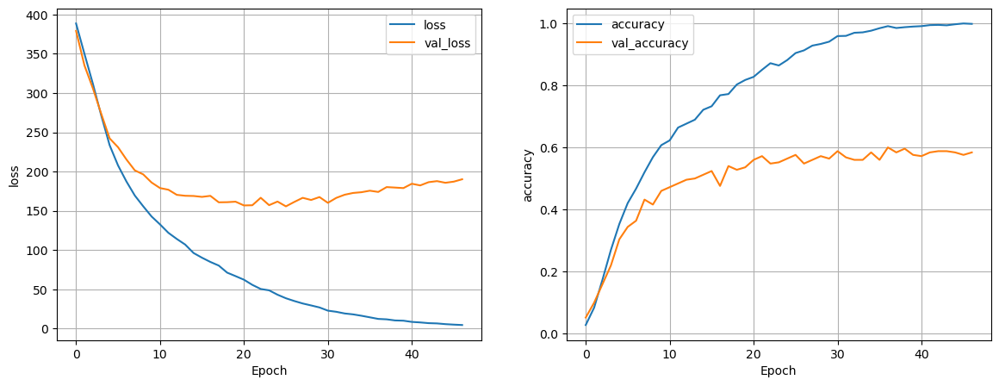

2023-09-01 01:18:51.000496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 01:18:51.001009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]


9/9 [==============================] - 5s 558ms/step - loss: 2.0673 - accuracy: 0.5400


{'loss': 2.067293882369995, 'accuracy': 0.5400000214576721}

9/9 [==============================] - 2s 182ms/step


2023-09-01 01:18:58.250543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-01 01:18:58.250913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_19' with dtype float
	 [[{{node Placeholder/_19}}]]


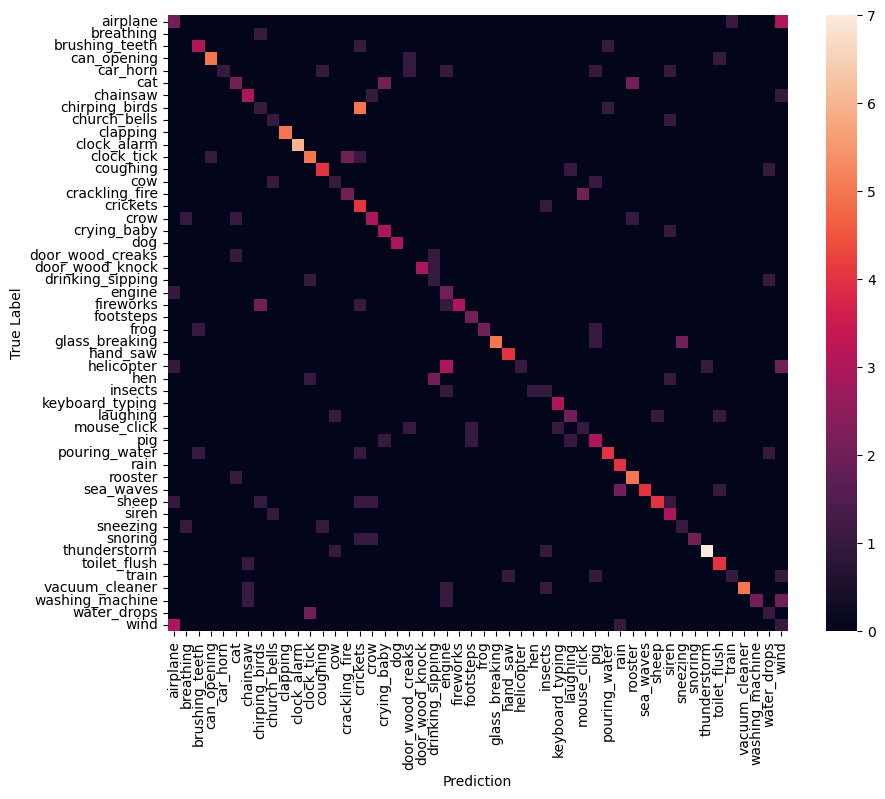

The most misclassified class is crickets
Audio category: crickets


The are more audio predicted as crickets then actually is:
Audio category misclassified as crickets: chirping_birds


In [42]:
#build the model
model = build_model(n_labels = n_labels, compile = False, **best_params)

epochs = 50
patience = 10 # early stopping patience
lr = best_params['learning_rate']
model, hisotry_supervised, confusion_mtx, evaluation = compile_fit_evaluate(df_ESC50, model, train, val, test, label_names,
                                     epochs = epochs,
                                     patience = patience,
                                     loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                                     optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=lr) if sys.platform == 'darwin' else tf.keras.optimizers.Adam(learning_rate=lr),
                                     metrics = ['accuracy'],#,'CategoricalAccuracy'],
                                     verbose = 1,
                                     show_history = True,
                                     show_test_evaluation = True,
                                     show_confusion_matrix = True,
                                     listen_to_wrong = True)

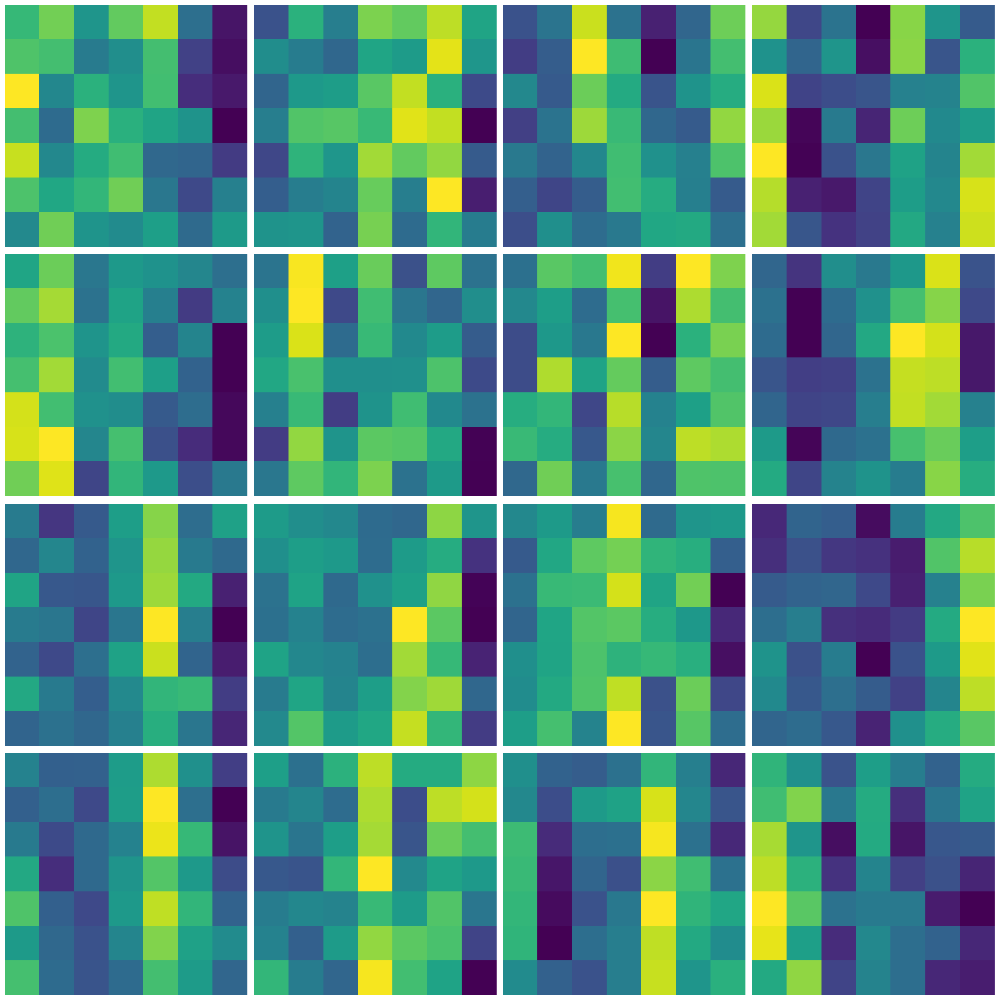

In [43]:
#show the weights of the first layer
visualize_the_weights(model, layer_number = 0, n_filters = 16, verbose = 0)

In [44]:
save_model_path = os.path.join(main_dir,'Saved_Models','ESC50_simple_CNN_MFCC_all_delta')
# save the model
model.save(save_model_path, save_format  ='keras')

INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_MFCC_all_delta/assets


INFO:tensorflow:Assets written to: /Users/leonardo/Desktop/HDA/Human_Data_Analytics_Project_2023/Saved_Models/ESC50_simple_CNN_MFCC_all_delta/assets
